# Whytehawk Clustering

In [1]:
#Import the required packages

import pandas as pd
import numpy as np
import geopandas as gpd
import geoplot
import matplotlib.pyplot as plt
import pyproj
import contextily as ctx
import seaborn as sns
import math
from sklearn.linear_model import LinearRegression
import statsmodels.api as sm
from statsmodels.graphics.gofplots import qqplot
import glob
import os
from IPython.display import Image
#from sklearn.decomposition import PCA
%config InlineBackend.figure_format='retina'
import tarfile
import urllib
from sklearn.metrics import silhouette_score, adjusted_rand_score
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import LabelEncoder, MinMaxScaler
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
%config InlineBackend.figure_format='retina'
from kneed import KneeLocator
from sklearn.datasets import make_blobs
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
pd.options.display.float_format = '{:.4f}'.format

In [6]:
#import full whytehawk dataset
os.chdir("C:/Users/medshesa/Documents/Whytehawk Project/Whytehawk Data")
full_table = pd.read_csv('full table.csv', index_col = 0)

In [3]:
full_table

,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),Leisure Periodic Use,...,Warehouse & Distribution,Warehousing Large Scale and High Bay,diversity,Crime Count,accessibility data combined,Business_Count,Bus,Rail,Road,crime per business
AL1 1B,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.6087,71.0000,0.0087,26,0.0009,0.0174,0.0078,2.7308
AL1 1D,0.0000,0.0000,0.0000,0.0000,0.0000,0.0107,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0425,27.0000,0.0075,3,0.0008,0.0145,0.0073,9.0000
AL1 1E,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.6393,7.0000,0.0108,34,0.0011,0.0232,0.0081,0.2059
AL1 1H,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0103,0.0305,...,0.0000,0.0000,0.4185,14.0000,0.0092,6,0.0009,0.0185,0.0083,2.3333
AL1 1J,0.0000,0.3926,0.0000,0.0000,0.1878,0.0000,0.0000,0.0429,0.0000,0.0000,...,0.0000,0.0000,0.7489,27.0000,0.0076,20,0.0007,0.0149,0.0072,1.3500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YO8 9P,0.0000,0.3704,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.6049,0.4964,63.0000,0.0017,9,0.0004,0.0033,0.0016,7.0000
YO8 9R,0.0000,0.0000,0.0000,0.0000,0.0000,0.0147,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0291,56.0000,0.0019,4,0.0005,0.0036,0.0017,14.0000
YO8 9S,0.0000,0.7005,0.0000,0.0000,0.0000,0.0000,0.0000,0.2995,0.0000,0.0000,...,0.0000,0.0000,0.4202,19.0000,0.0019,3,0.0005,0.0036,0.0017,6.3333
YO8 9T,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,10.0000,0.0019,1,0.0004,0.0036,0.0017,10.0000


In [7]:
#df shape
full_table.shape

(87243, 33)

## Adding Urban-Rural index to whytehawk data

In [11]:
#import urban rural dataset
#os.chdir("C:/Users/medshesa/Documents/Whytehawk Project/Whytehawk Data")
postcodes_and_urban_rural = pd.read_csv('postcodes_and_urban_rural.csv', index_col = 1)

In [12]:
postcodes_and_urban_rural

,Unnamed: 0,ruc11cd,ruc11
postcode zones,,,
EC2Y 8B,162352,A1,Urban major conurbation
VEC0059,162353,A1,Urban major conurbation
EC2Y 8E,162351,A1,Urban major conurbation
EC2Y 8D,162353,A1,Urban major conurbation
EC1A 4A,162351,A1,Urban major conurbation
...,...,...,...
CF14 5Z,181355,C1,Urban city and town
CF10 1R,181358,C1,Urban city and town
CF10 4X,181360,C1,Urban city and town


In [13]:
#Drop column unnamed
postcodes_and_urban_rural = postcodes_and_urban_rural.drop(['Unnamed: 0'], axis=1)

In [14]:
#Urban-Rural Types
postcodes_and_urban_rural['ruc11'].unique()

array(['Urban major conurbation', 'Rural town and fringe',
       'Urban city and town', 'Rural hamlets and isolated dwellings',
       'Rural hamlets and isolated dwellings in a sparse setting',
       'Rural village', 'Urban minor conurbation',
       'Rural town and fringe in a sparse setting',
       'Rural village in a sparse setting',
       'Urban city and town in a sparse setting'], dtype=object)

In [15]:
#rename and copy type column
postcodes_and_urban_rural['Urban_Rural_Index'] = postcodes_and_urban_rural['ruc11']

In [16]:
#Change to numeric scale
postcodes_and_urban_rural['Urban_Rural_Index1'] = postcodes_and_urban_rural['Urban_Rural_Index'].replace(['Urban major conurbation', 'Urban city and town', 'Rural hamlets and isolated dwellings','Rural village','Rural town and fringe', 'Rural hamlets and isolated dwellings in a sparse setting', 'Urban city and town in a sparse setting','Rural town and fringe in a sparse setting', 'Rural village in a sparse setting', 'Urban minor conurbation'],['1','3','7','6','5','10','4','8','9','2'])

In [17]:
postcodes_and_urban_rural

,ruc11cd,ruc11,Urban_Rural_Index,Urban_Rural_Index1
postcode zones,,,,
EC2Y 8B,A1,Urban major conurbation,Urban major conurbation,1
VEC0059,A1,Urban major conurbation,Urban major conurbation,1
EC2Y 8E,A1,Urban major conurbation,Urban major conurbation,1
EC2Y 8D,A1,Urban major conurbation,Urban major conurbation,1
EC1A 4A,A1,Urban major conurbation,Urban major conurbation,1
...,...,...,...,...
CF14 5Z,C1,Urban city and town,Urban city and town,3
CF10 1R,C1,Urban city and town,Urban city and town,3
CF10 4X,C1,Urban city and town,Urban city and town,3


In [18]:
#Drop column ruc11
postcodes_and_urban_rural = postcodes_and_urban_rural.drop(['ruc11'], axis=1)

In [19]:
#Merge full tabel and urban rural index base on postcode 
full_table_urban = full_table.merge(postcodes_and_urban_rural, how='inner', left_index=True, right_index=True)

In [20]:
full_table_urban

,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),Leisure Periodic Use,...,Crime Count,accessibility data combined,Business_Count,Bus,Rail,Road,crime per business,ruc11cd,Urban_Rural_Index,Urban_Rural_Index1
AL1 1B,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,71.0000,0.0087,26,0.0009,0.0174,0.0078,2.7308,C1,Urban city and town,3
AL1 1D,0.0000,0.0000,0.0000,0.0000,0.0000,0.0107,0.0000,0.0000,0.0000,0.0000,...,27.0000,0.0075,3,0.0008,0.0145,0.0073,9.0000,C1,Urban city and town,3
AL1 1E,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,7.0000,0.0108,34,0.0011,0.0232,0.0081,0.2059,C1,Urban city and town,3
AL1 1H,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0103,0.0305,...,14.0000,0.0092,6,0.0009,0.0185,0.0083,2.3333,C1,Urban city and town,3
AL1 1J,0.0000,0.3926,0.0000,0.0000,0.1878,0.0000,0.0000,0.0429,0.0000,0.0000,...,27.0000,0.0076,20,0.0007,0.0149,0.0072,1.3500,C1,Urban city and town,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YO8 9P,0.0000,0.3704,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,63.0000,0.0017,9,0.0004,0.0033,0.0016,7.0000,F1,Rural hamlets and isolated dwellings,7
YO8 9R,0.0000,0.0000,0.0000,0.0000,0.0000,0.0147,0.0000,0.0000,0.0000,0.0000,...,56.0000,0.0019,4,0.0005,0.0036,0.0017,14.0000,D1,Rural town and fringe,5
YO8 9S,0.0000,0.7005,0.0000,0.0000,0.0000,0.0000,0.0000,0.2995,0.0000,0.0000,...,19.0000,0.0019,3,0.0005,0.0036,0.0017,6.3333,C1,Urban city and town,3
YO8 9T,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,...,10.0000,0.0019,1,0.0004,0.0036,0.0017,10.0000,C1,Urban city and town,3


In [21]:
#rename table
full_table = full_table_urban.copy()

In [22]:
#df shape
full_table_urban.shape

(87243, 36)

Text(0.5, 1.0, 'Cluster 7')

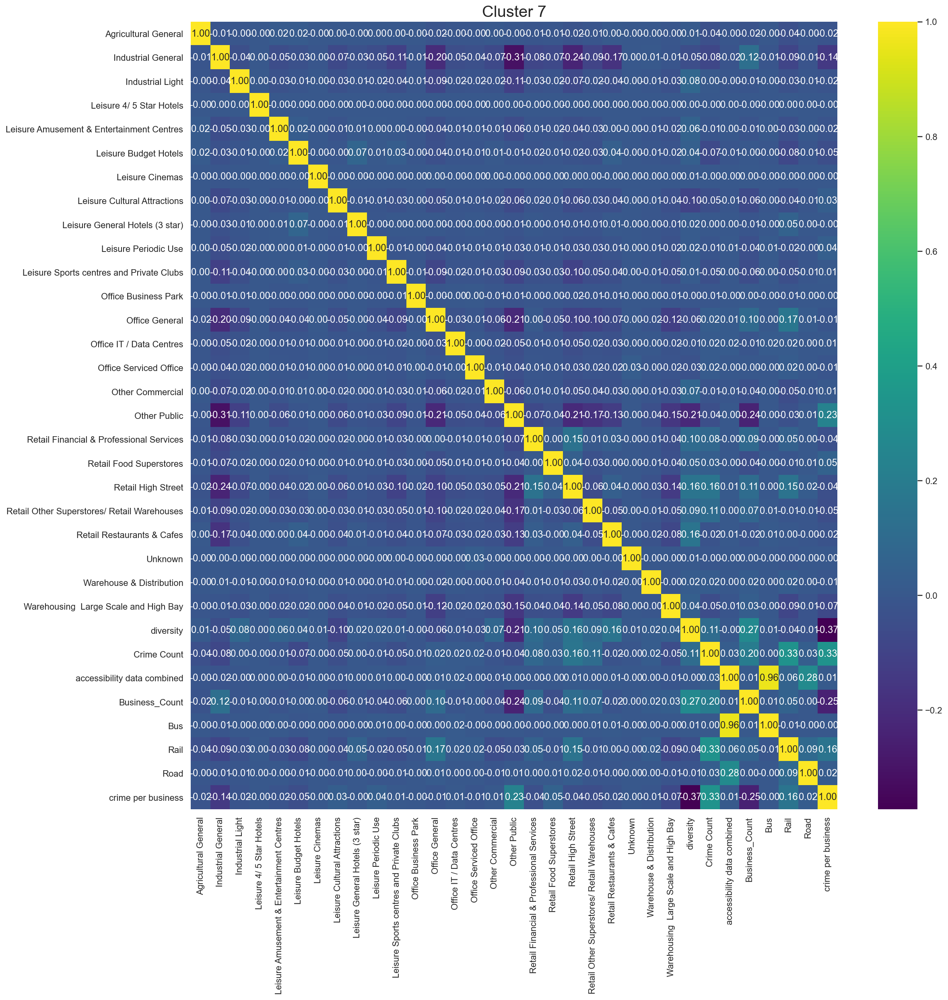

In [66]:
#See correlations between variables
# set figure size
plt.figure(figsize=(18,18))
# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
sns.heatmap(full_table.corr(), annot=True, cmap='viridis', fmt=".2f");
plt.title('Cluster 7', fontsize=20)


In [23]:
#Drop unuseful columns
full_table = full_table.drop(['Business_Count'], axis=1)
full_table = full_table.drop(['Crime Count'], axis=1)
full_table = full_table.drop(['ruc11cd'], axis=1)
full_table = full_table.drop(['Urban_Rural_Index'], axis=1)

In [24]:
full_table

,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),Leisure Periodic Use,...,Unknown,Warehouse & Distribution,Warehousing Large Scale and High Bay,diversity,accessibility data combined,Bus,Rail,Road,crime per business,Urban_Rural_Index1
AL1 1B,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.6087,0.0087,0.0009,0.0174,0.0078,2.7308,3
AL1 1D,0.0000,0.0000,0.0000,0.0000,0.0000,0.0107,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0425,0.0075,0.0008,0.0145,0.0073,9.0000,3
AL1 1E,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.6393,0.0108,0.0011,0.0232,0.0081,0.2059,3
AL1 1H,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0103,0.0305,...,0.0000,0.0000,0.0000,0.4185,0.0092,0.0009,0.0185,0.0083,2.3333,3
AL1 1J,0.0000,0.3926,0.0000,0.0000,0.1878,0.0000,0.0000,0.0429,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.7489,0.0076,0.0007,0.0149,0.0072,1.3500,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YO8 9P,0.0000,0.3704,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.6049,0.4964,0.0017,0.0004,0.0033,0.0016,7.0000,7
YO8 9R,0.0000,0.0000,0.0000,0.0000,0.0000,0.0147,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0291,0.0019,0.0005,0.0036,0.0017,14.0000,5
YO8 9S,0.0000,0.7005,0.0000,0.0000,0.0000,0.0000,0.0000,0.2995,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.4202,0.0019,0.0005,0.0036,0.0017,6.3333,3
YO8 9T,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0019,0.0004,0.0036,0.0017,10.0000,3


## Adequacy Tests for factor analysis 

In [5]:
full_table

,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),Leisure Periodic Use,...,Warehouse & Distribution,Warehousing Large Scale and High Bay,diversity,Crime Count,accessibility data combined,Business_Count,Bus,Rail,Road,crime per business
AL1 1B,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.6087,71.0000,0.0087,26,0.0009,0.0174,0.0078,2.7308
AL1 1D,0.0000,0.0000,0.0000,0.0000,0.0000,0.0107,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0425,27.0000,0.0075,3,0.0008,0.0145,0.0073,9.0000
AL1 1E,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.6393,7.0000,0.0108,34,0.0011,0.0232,0.0081,0.2059
AL1 1H,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0103,0.0305,...,0.0000,0.0000,0.4185,14.0000,0.0092,6,0.0009,0.0185,0.0083,2.3333
AL1 1J,0.0000,0.3926,0.0000,0.0000,0.1878,0.0000,0.0000,0.0429,0.0000,0.0000,...,0.0000,0.0000,0.7489,27.0000,0.0076,20,0.0007,0.0149,0.0072,1.3500
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YO8 9P,0.0000,0.3704,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.6049,0.4964,63.0000,0.0017,9,0.0004,0.0033,0.0016,7.0000
YO8 9R,0.0000,0.0000,0.0000,0.0000,0.0000,0.0147,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0291,56.0000,0.0019,4,0.0005,0.0036,0.0017,14.0000
YO8 9S,0.0000,0.7005,0.0000,0.0000,0.0000,0.0000,0.0000,0.2995,0.0000,0.0000,...,0.0000,0.0000,0.4202,19.0000,0.0019,3,0.0005,0.0036,0.0017,6.3333
YO8 9T,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,10.0000,0.0019,1,0.0004,0.0036,0.0017,10.0000


In [24]:
#calculate bartlett sphericity test

from factor_analyzer.factor_analyzer import calculate_bartlett_sphericity
chi_square_value,p_value=calculate_bartlett_sphericity(full_table)
chi_square_value, p_value

TypeError: unsupported operand type(s) for -: 'str' and 'float'

In [40]:
#KMO test
from factor_analyzer.factor_analyzer import calculate_kmo
kmo_all,kmo_model=calculate_kmo(full_table)

C:\ProgramData\Anaconda3\envs\geo_env\lib\site-packages\factor_analyzer\utils.py:248: UserWarning: The inverse of the variance-covariance matrix was calculated using the Moore-Penrose generalized matrix inversion, due to its determinant being at or very close to zero.
  warnings.warn('The inverse of the variance-covariance matrix '


In [41]:
kmo_model

0.010676447244739526

# Standardisation

In [25]:
full_table

,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),Leisure Periodic Use,...,Unknown,Warehouse & Distribution,Warehousing Large Scale and High Bay,diversity,accessibility data combined,Bus,Rail,Road,crime per business,Urban_Rural_Index1
AL1 1B,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.6087,0.0087,0.0009,0.0174,0.0078,2.7308,3
AL1 1D,0.0000,0.0000,0.0000,0.0000,0.0000,0.0107,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0425,0.0075,0.0008,0.0145,0.0073,9.0000,3
AL1 1E,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.6393,0.0108,0.0011,0.0232,0.0081,0.2059,3
AL1 1H,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0103,0.0305,...,0.0000,0.0000,0.0000,0.4185,0.0092,0.0009,0.0185,0.0083,2.3333,3
AL1 1J,0.0000,0.3926,0.0000,0.0000,0.1878,0.0000,0.0000,0.0429,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.7489,0.0076,0.0007,0.0149,0.0072,1.3500,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YO8 9P,0.0000,0.3704,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.6049,0.4964,0.0017,0.0004,0.0033,0.0016,7.0000,7
YO8 9R,0.0000,0.0000,0.0000,0.0000,0.0000,0.0147,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0291,0.0019,0.0005,0.0036,0.0017,14.0000,5
YO8 9S,0.0000,0.7005,0.0000,0.0000,0.0000,0.0000,0.0000,0.2995,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.4202,0.0019,0.0005,0.0036,0.0017,6.3333,3
YO8 9T,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0019,0.0004,0.0036,0.0017,10.0000,3


In [26]:
#Fill na in crime column with zero
full_table['crime per business'] = full_table['crime per business'].fillna(0)

In [27]:
#counting number of zeros
print ((full_table['crime per business'] == 0).sum())

7905


In [28]:
#Change datatype of Urban-Rural index
full_table["Urban_Rural_Index1"] = pd.to_numeric(full_table["Urban_Rural_Index1"])

In [29]:
#data types
full_table.dtypes

Agricultural General                           float64
Industrial General                             float64
Industrial Light                               float64
Leisure 4/ 5 Star Hotels                       float64
Leisure Amusement & Entertainment Centres      float64
Leisure Budget Hotels                          float64
Leisure Cinemas                                float64
Leisure Cultural Attractions                   float64
Leisure General Hotels (3 star)                float64
Leisure Periodic Use                           float64
Leisure Sports centres and Private Clubs       float64
Office Business Park                           float64
Office General                                 float64
Office IT / Data Centres                       float64
Office Serviced Office                         float64
Other Commercial                               float64
Other Public                                   float64
Retail Financial & Professional Services       float64
Retail Foo

In [30]:
#MinMax standardisation
table_std = MinMaxScaler().fit_transform(full_table)

In [31]:
#Standard scaler standardisation
table_std2 = StandardScaler().fit_transform(full_table)

In [32]:
#Fit standardised scores to orginal table (MinMax)
table_std_df = pd.DataFrame(MinMaxScaler().fit_transform(full_table), columns = full_table.columns).set_index(full_table.index.values)

In [33]:
table_std_df

,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),Leisure Periodic Use,...,Unknown,Warehouse & Distribution,Warehousing Large Scale and High Bay,diversity,accessibility data combined,Bus,Rail,Road,crime per business,Urban_Rural_Index1
AL1 1B,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.6888,0.0008,0.0000,0.0384,0.0007,0.0038,0.2222
AL1 1D,0.0000,0.0000,0.0000,0.0000,0.0000,0.0107,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0481,0.0006,0.0000,0.0321,0.0007,0.0125,0.2222
AL1 1E,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.7234,0.0009,0.0000,0.0515,0.0008,0.0003,0.2222
AL1 1H,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0103,0.0305,...,0.0000,0.0000,0.0000,0.4735,0.0008,0.0000,0.0409,0.0008,0.0032,0.2222
AL1 1J,0.0000,0.3926,0.0000,0.0000,0.1878,0.0000,0.0000,0.0429,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.8473,0.0007,0.0000,0.0330,0.0007,0.0019,0.2222
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YO8 9P,0.0000,0.3704,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.6049,0.5617,0.0001,0.0000,0.0070,0.0001,0.0097,0.6667
YO8 9R,0.0000,0.0000,0.0000,0.0000,0.0000,0.0147,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0329,0.0002,0.0000,0.0077,0.0002,0.0195,0.4444
YO8 9S,0.0000,0.7005,0.0000,0.0000,0.0000,0.0000,0.0000,0.2995,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.4755,0.0002,0.0000,0.0076,0.0002,0.0088,0.2222
YO8 9T,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0000,0.0002,0.0000,0.0076,0.0001,0.0139,0.2222


# Scree plot and PCA

In [39]:
# Create a PCA instance: pca
pca = PCA(n_components=32)
principalComponents = pca.fit_transform(table_std)

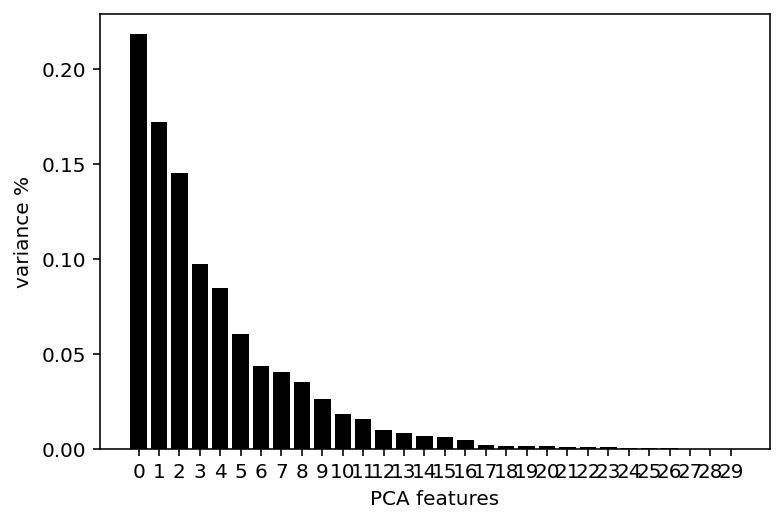

In [40]:
# Plot the explained variances
features = range(pca.n_components_)
plt.bar(features, pca.explained_variance_ratio_, color='black')
plt.xlabel('PCA features')
plt.ylabel('variance %')
plt.xticks(features)


plt.xticks(features)
# Save components to a DataFrame
PCA_components = pd.DataFrame(principalComponents)

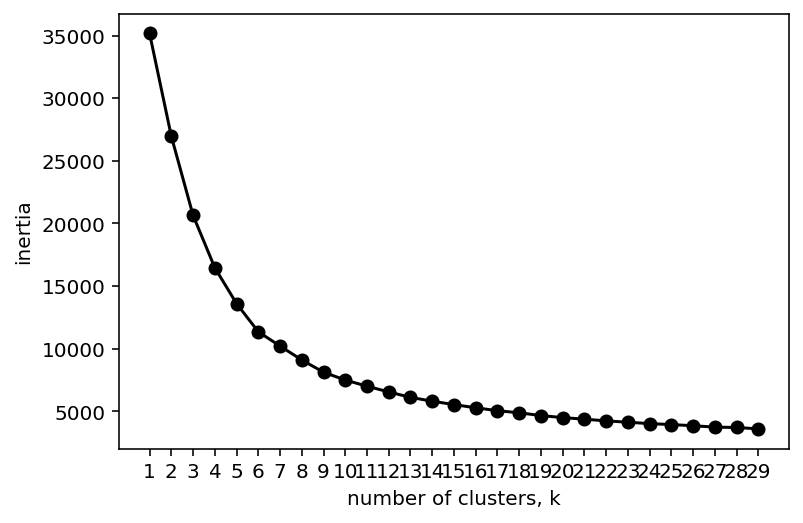

In [41]:
#Inertia: Intuitively, inertia tells how far away the points within a cluster are.
#Therefore, a small of inertia is aimed for. 
#The range of inertia’s value starts from zero and goes up.
ks = range(1, 30)
inertias = []
for k in ks:
    # Create a KMeans instance with k clusters: model
    model = KMeans(n_clusters=k)
    
    # Fit model to samples
    model.fit(PCA_components.iloc[:,:5])
    
    # Append the inertia to the list of inertias
    inertias.append(model.inertia_)
    
plt.plot(ks, inertias, '-o', color='black')
plt.xlabel('number of clusters, k')
plt.ylabel('inertia')
plt.xticks(ks)
plt.show()

## K-means output

In [42]:
#Building K-means preprocessor pipeline
preprocessor = Pipeline(
    [
        ("scaler", MinMaxScaler()),
        ("pca", PCA(n_components=5, random_state=None)),#specify number of components from PCA
    ]
)

In [43]:
#Clustering pipeline
clusterer = Pipeline(
   [
       (
           "kmeans",
           KMeans(
               n_clusters=9, # n_clusters set the K for clustering
               init="k-means++", # controls the initialization technique, choosinf the initial values or seed for k-mean clustering. K-Means++ is a smart centroid initialization techniqu
               n_init=10, # sets the number of initializations to perform. perform ten k-means runs and return the results of the one with the lowest SSE
               max_iter=300, # maximum iterations
               random_state=None, # Determines random number generation for centroid initialization. Use an int to make the randomness deterministic.Mainly used for increasing reproducability
           ),
       ),
   ]
)

In [44]:
#Full pipeline
pipe = Pipeline(
    [
        ("preprocessor", preprocessor),
        ("clusterer", clusterer)
    ]
)

In [45]:
#Fit full table to clustering pipeline
pipe.fit(full_table)

Pipeline(steps=[('preprocessor',
                 Pipeline(steps=[('scaler', MinMaxScaler()),
                                 ('pca', PCA(n_components=5))])),
                ('clusterer',
                 Pipeline(steps=[('kmeans', KMeans(n_clusters=9))]))])

In [46]:
#preprocessored data
preprocessed_data = pipe["preprocessor"].transform(full_table)

In [47]:
#Assigning kmean cluster to postcodes
predicted_labels = pipe["clusterer"]["kmeans"].labels_

# Investigating how the K-means is constructing the clusters

In [51]:
#size of predicted_labels
predicted_labels.shape

(87243,)

In [52]:
#making a copy of table to add the clusters 
clustertable = table_std_df.copy()

In [53]:
#add predicted labels (clusters) to clusterable
clustertable['Clusters'] = predicted_labels

In [54]:
clustertable

,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),Leisure Periodic Use,...,Warehouse & Distribution,Warehousing Large Scale and High Bay,diversity,accessibility data combined,Bus,Rail,Road,crime per business,Urban_Rural_Index1,Clusters
AL1 1B,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.6888,0.0008,0.0000,0.0384,0.0007,0.0038,0.2222,3
AL1 1D,0.0000,0.0000,0.0000,0.0000,0.0000,0.0107,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0481,0.0006,0.0000,0.0321,0.0007,0.0125,0.2222,8
AL1 1E,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.7234,0.0009,0.0000,0.0515,0.0008,0.0003,0.2222,3
AL1 1H,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0103,0.0305,...,0.0000,0.0000,0.4735,0.0008,0.0000,0.0409,0.0008,0.0032,0.2222,4
AL1 1J,0.0000,0.3926,0.0000,0.0000,0.1878,0.0000,0.0000,0.0429,0.0000,0.0000,...,0.0000,0.0000,0.8473,0.0007,0.0000,0.0330,0.0007,0.0019,0.2222,6
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YO8 9P,0.0000,0.3704,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.6049,0.5617,0.0001,0.0000,0.0070,0.0001,0.0097,0.6667,5
YO8 9R,0.0000,0.0000,0.0000,0.0000,0.0000,0.0147,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0329,0.0002,0.0000,0.0077,0.0002,0.0195,0.4444,8
YO8 9S,0.0000,0.7005,0.0000,0.0000,0.0000,0.0000,0.0000,0.2995,0.0000,0.0000,...,0.0000,0.0000,0.4755,0.0002,0.0000,0.0076,0.0002,0.0088,0.2222,6
YO8 9T,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0002,0.0000,0.0076,0.0001,0.0139,0.2222,1


In [55]:
#Data types
clustertable.dtypes

Agricultural General                           float64
Industrial General                             float64
Industrial Light                               float64
Leisure 4/ 5 Star Hotels                       float64
Leisure Amusement & Entertainment Centres      float64
Leisure Budget Hotels                          float64
Leisure Cinemas                                float64
Leisure Cultural Attractions                   float64
Leisure General Hotels (3 star)                float64
Leisure Periodic Use                           float64
Leisure Sports centres and Private Clubs       float64
Office Business Park                           float64
Office General                                 float64
Office IT / Data Centres                       float64
Office Serviced Office                         float64
Other Commercial                               float64
Other Public                                   float64
Retail Financial & Professional Services       float64
Retail Foo

In [150]:
#save table
clustertable.to_csv("C:/Users/medshesa/Documents/Whytehawk Project/Whytehawk Data/table with clusters2.csv", index=True, encoding='utf-8-sig')

In [15]:
#inmport save table from above cell
os.chdir("C:/Users/medshesa/Documents/Whytehawk Project/Whytehawk Data")
clustertable = pd.read_csv('table with clusters2.csv', index_col = 0)

In [9]:
#count the number of clusters 
from collections import Counter
Counter(predicted_labels)

NameError: name 'predicted_labels' is not defined

In [11]:
#Change the randomly assigned cluster labels so that they fit with the appropriate clusters wehn rerunning the code
clustertable['Clusters'] = clustertable['Clusters'].replace([0,1,2,3,4,5,6,7,8,], [8,5,0,7,6,4,3,1,2])


In [58]:
#Table with clusters included
clustertable

,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),Leisure Periodic Use,...,Warehouse & Distribution,Warehousing Large Scale and High Bay,diversity,accessibility data combined,Bus,Rail,Road,crime per business,Urban_Rural_Index1,Clusters
AL1 1B,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.6888,0.0008,0.0000,0.0384,0.0007,0.0038,0.2222,7
AL1 1D,0.0000,0.0000,0.0000,0.0000,0.0000,0.0107,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0481,0.0006,0.0000,0.0321,0.0007,0.0125,0.2222,2
AL1 1E,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.7234,0.0009,0.0000,0.0515,0.0008,0.0003,0.2222,7
AL1 1H,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0103,0.0305,...,0.0000,0.0000,0.4735,0.0008,0.0000,0.0409,0.0008,0.0032,0.2222,6
AL1 1J,0.0000,0.3926,0.0000,0.0000,0.1878,0.0000,0.0000,0.0429,0.0000,0.0000,...,0.0000,0.0000,0.8473,0.0007,0.0000,0.0330,0.0007,0.0019,0.2222,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YO8 9P,0.0000,0.3704,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.6049,0.5617,0.0001,0.0000,0.0070,0.0001,0.0097,0.6667,4
YO8 9R,0.0000,0.0000,0.0000,0.0000,0.0000,0.0147,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0329,0.0002,0.0000,0.0077,0.0002,0.0195,0.4444,2
YO8 9S,0.0000,0.7005,0.0000,0.0000,0.0000,0.0000,0.0000,0.2995,0.0000,0.0000,...,0.0000,0.0000,0.4755,0.0002,0.0000,0.0076,0.0002,0.0088,0.2222,3
YO8 9T,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0002,0.0000,0.0076,0.0001,0.0139,0.2222,5


In [25]:
clustertable = clustertable.rename(columns={"accessibility data combined":"Accessibility Data Combined","crime per business":"Crime per Business", "Urban_Rural_Index1": "Urban-Rural Index"})

In [26]:
#compiling different clusters
clustertable[clustertable['Clusters'] ==0] 
clustertable[clustertable['Clusters'] ==1] 
clustertable[clustertable['Clusters'] ==2] 
clustertable[clustertable['Clusters'] ==3]
clustertable[clustertable['Clusters'] ==4]
clustertable[clustertable['Clusters'] ==5] 
clustertable[clustertable['Clusters'] ==6] 
clustertable[clustertable['Clusters'] ==7] 
clustertable[clustertable['Clusters'] ==8]

,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),Leisure Periodic Use,...,Warehouse & Distribution,Warehousing Large Scale and High Bay,diversity,Accessibility Data Combined,Bus,Rail,Road,Crime per Business,Urban-Rural Index,Clusters
AL1 1U,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.2899,0.0007,0.0000,0.0356,0.0006,0.0064,0.2222,8
AL1 2J,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.1236,0.0006,0.0000,0.0295,0.0008,0.0161,0.2222,8
AL1 5P,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.4826,0.0006,0.0000,0.0336,0.0006,0.0067,0.2222,8
AL10 0Q,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.5665,0.0006,0.0001,0.0310,0.0006,0.0890,0.2222,8
AL10 0X,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0711,0.6195,0.0007,0.0000,0.0399,0.0005,0.0000,0.2222,8
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
YO8 3G,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.2394,0.6558,0.0002,0.0000,0.0127,0.0002,0.0197,0.2222,8
YO8 3N,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.1387,0.0002,0.0000,0.0127,0.0002,0.0292,0.2222,8
YO8 4J,0.0000,0.0020,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.5658,0.0002,0.0000,0.0088,0.0002,0.0064,0.2222,8
YO8 4L,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.0002,0.0000,0.0127,0.0002,0.0111,0.2222,8


In [27]:
#take a random sample of the clusters 
sample_clustertable=clustertable.sample(n=10000, random_state=1)

In [28]:
#Create a df for each ample of clusters
sample_cluster0 = sample_clustertable[clustertable['Clusters'] ==0] 
sample_cluster1 = sample_clustertable[clustertable['Clusters'] ==1] 
sample_cluster2 = sample_clustertable[clustertable['Clusters'] ==2] 
sample_cluster3 = sample_clustertable[clustertable['Clusters'] ==3] 
sample_cluster4 = sample_clustertable[clustertable['Clusters'] ==4] 
sample_cluster5 = sample_clustertable[clustertable['Clusters'] ==5] 
sample_cluster6 = sample_clustertable[clustertable['Clusters'] ==6] 
sample_cluster7 = sample_clustertable[clustertable['Clusters'] ==7] 
sample_cluster8 = sample_clustertable[clustertable['Clusters'] ==8] 



<ipython-input-28-8837ae34f95f>:2: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sample_cluster0 = sample_clustertable[clustertable['Clusters'] ==0]
<ipython-input-28-8837ae34f95f>:3: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sample_cluster1 = sample_clustertable[clustertable['Clusters'] ==1]
<ipython-input-28-8837ae34f95f>:4: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sample_cluster2 = sample_clustertable[clustertable['Clusters'] ==2]
<ipython-input-28-8837ae34f95f>:5: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sample_cluster3 = sample_clustertable[clustertable['Clusters'] ==3]
<ipython-input-28-8837ae34f95f>:6: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  sample_cluster4 = sample_clustertable[clustertable['Clusters'] ==4]
<ipython-input-28-8837ae34f95f>:7: UserWarning: Boolean Series key will be reindexed to match D

In [29]:
#delet clsuter column so it won't be displayed in the visulation
del sample_cluster0['Clusters']
del sample_cluster1['Clusters']
del sample_cluster2['Clusters']
del sample_cluster3['Clusters']
del sample_cluster4['Clusters']
del sample_cluster5['Clusters']
del sample_cluster6['Clusters']
del sample_cluster7['Clusters']
del sample_cluster8['Clusters']


In [30]:
#investigate the composition of cluster 3 as an example
sample_cluster3.describe()

,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),Leisure Periodic Use,...,Unknown,Warehouse & Distribution,Warehousing Large Scale and High Bay,diversity,Accessibility Data Combined,Bus,Rail,Road,Crime per Business,Urban-Rural Index
count,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,...,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000,1307.0000
mean,0.0005,0.5344,0.0376,0.0000,0.0072,0.0010,0.0000,0.0036,0.0002,0.0048,...,0.0000,0.0061,0.0816,0.6529,0.0006,0.0001,0.0234,0.0007,0.0064,0.2133
std,0.0052,0.1334,0.0998,0.0000,0.0340,0.0077,0.0000,0.0304,0.0030,0.0361,...,0.0000,0.0416,0.1538,0.1102,0.0010,0.0008,0.0195,0.0017,0.0122,0.1902
min,0.0000,0.1492,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.3685,0.0000,0.0000,0.0003,0.0000,0.0000,0.0000
25%,0.0000,0.4370,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.5658,0.0002,0.0000,0.0084,0.0002,0.0009,0.0000
50%,0.0000,0.5523,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0000,0.6504,0.0004,0.0000,0.0197,0.0004,0.0028,0.2222
75%,0.0000,0.6418,0.0278,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0938,0.7423,0.0007,0.0000,0.0325,0.0008,0.0068,0.2222
max,0.1267,0.7623,0.7958,0.0000,0.4699,0.1529,0.0000,0.6059,0.0703,0.7429,...,0.0000,0.7127,0.7770,0.9024,0.0226,0.0224,0.1497,0.0298,0.1766,0.6667


# Visualising compositions of clusters

(0.0, 1.0)

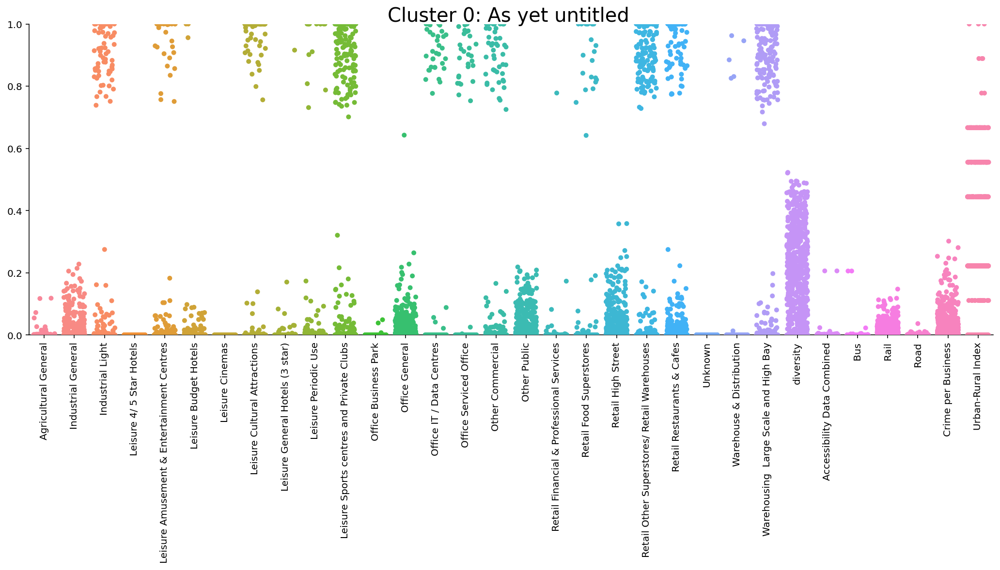

In [38]:
#producing catplots
x = sns.catplot(data=sample_cluster0, jitter=0.35, aspect=3)
x.set_xticklabels(rotation=90)
x.fig.suptitle('Cluster 0: As yet untitled', fontsize=20, y=1.02)
plt.ylim(0, 1)

(0.0, 1.0)

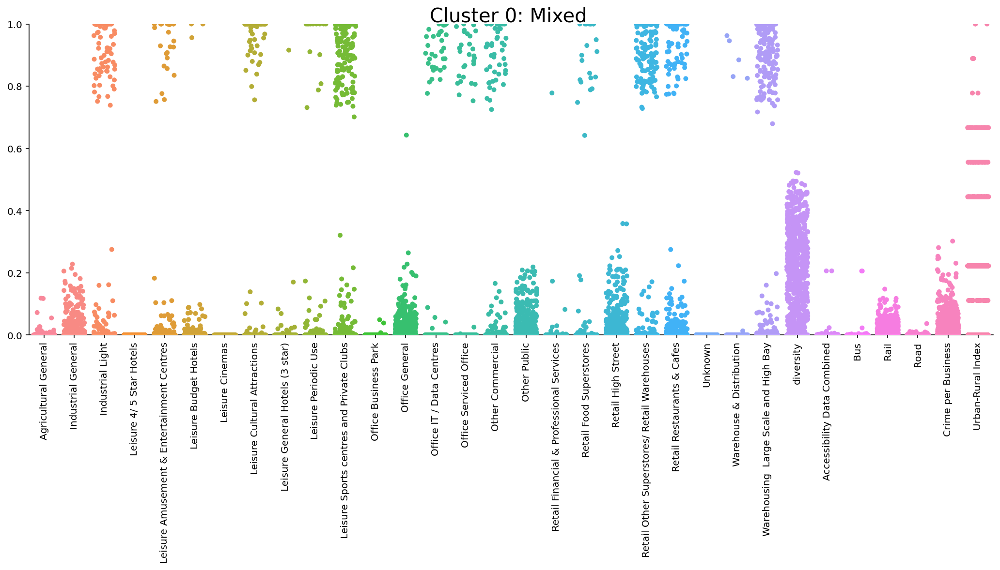

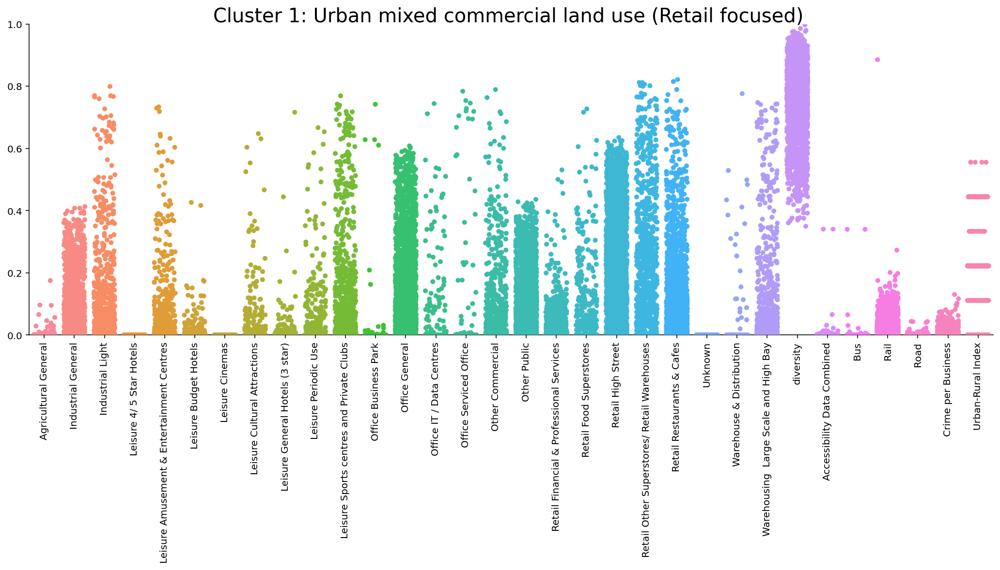

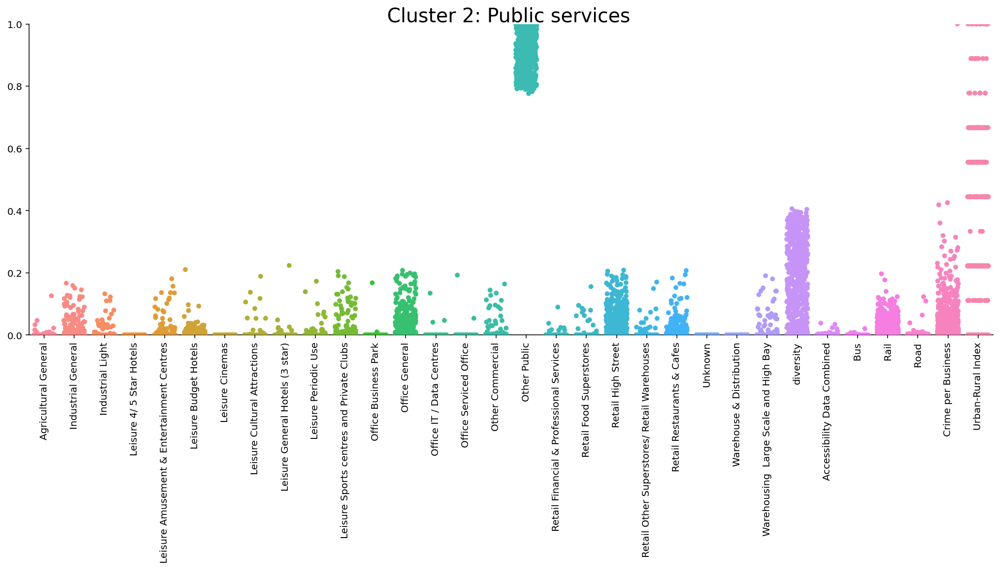

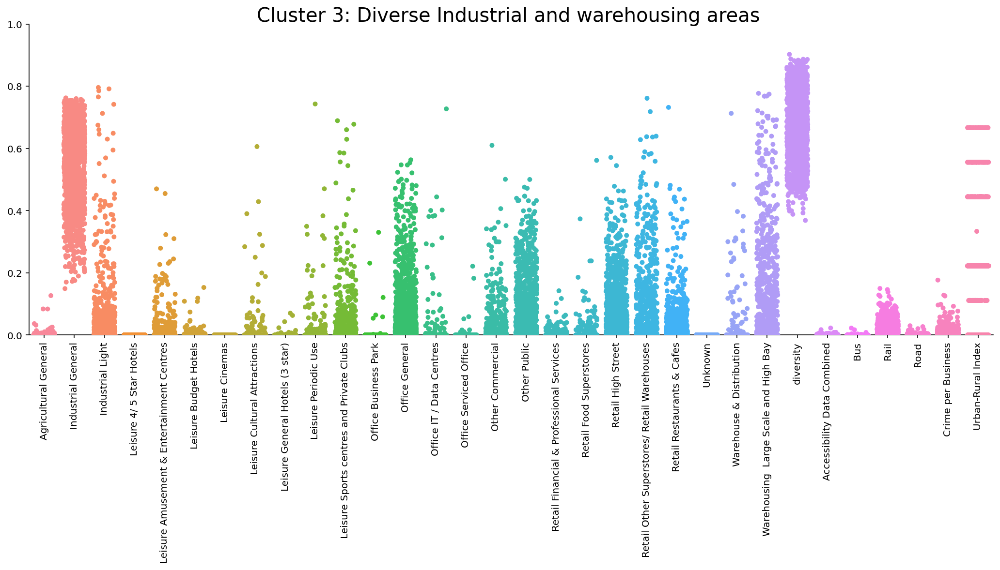

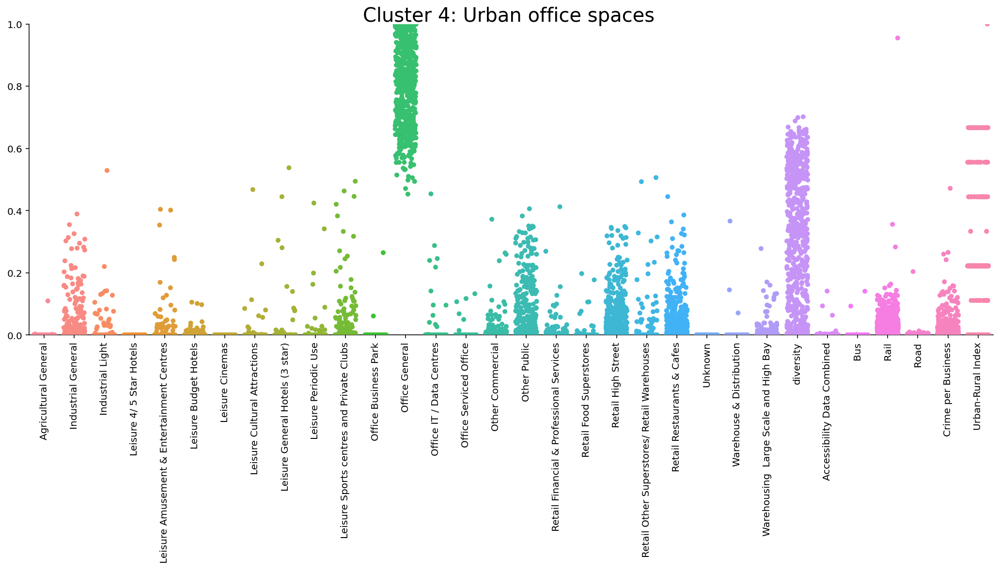

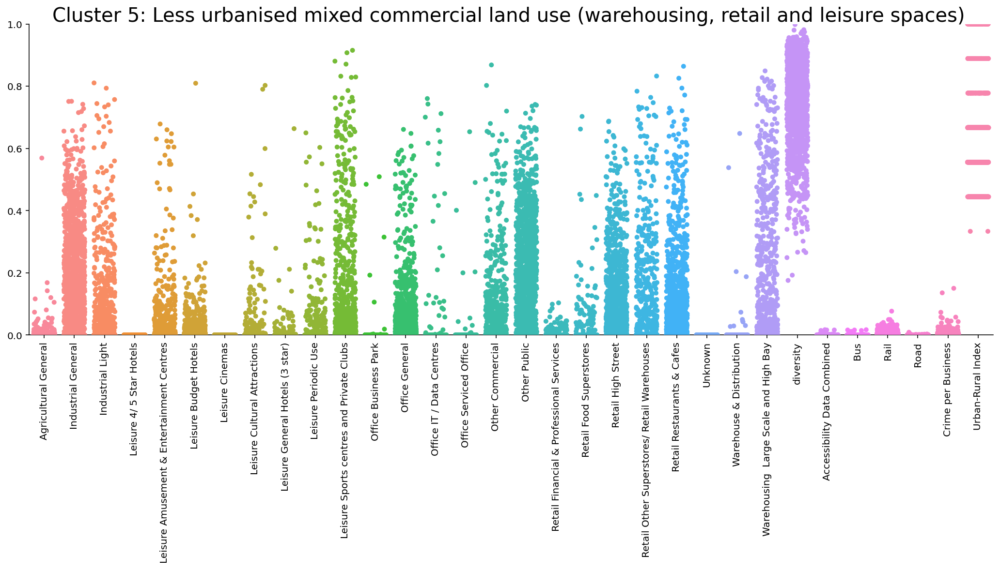

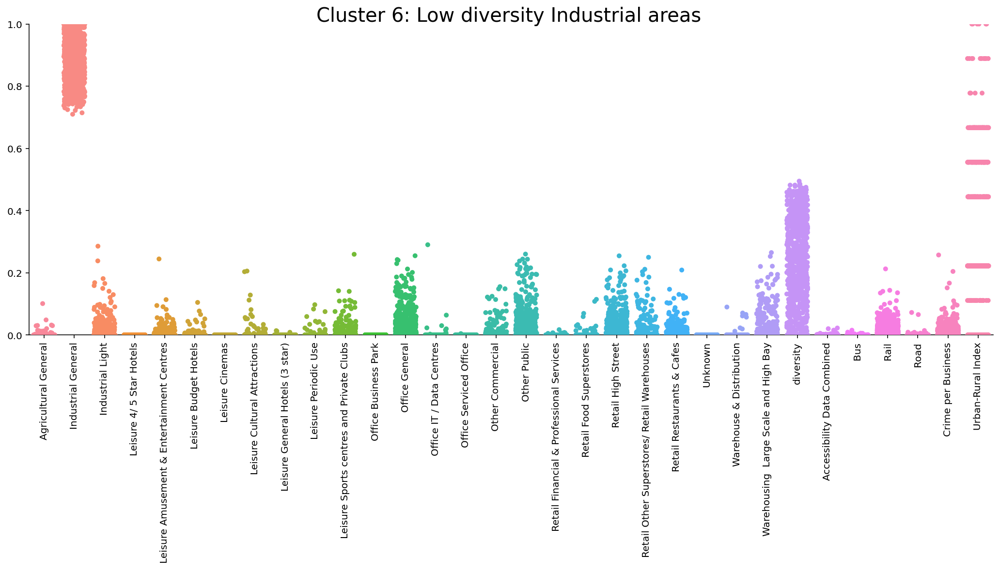

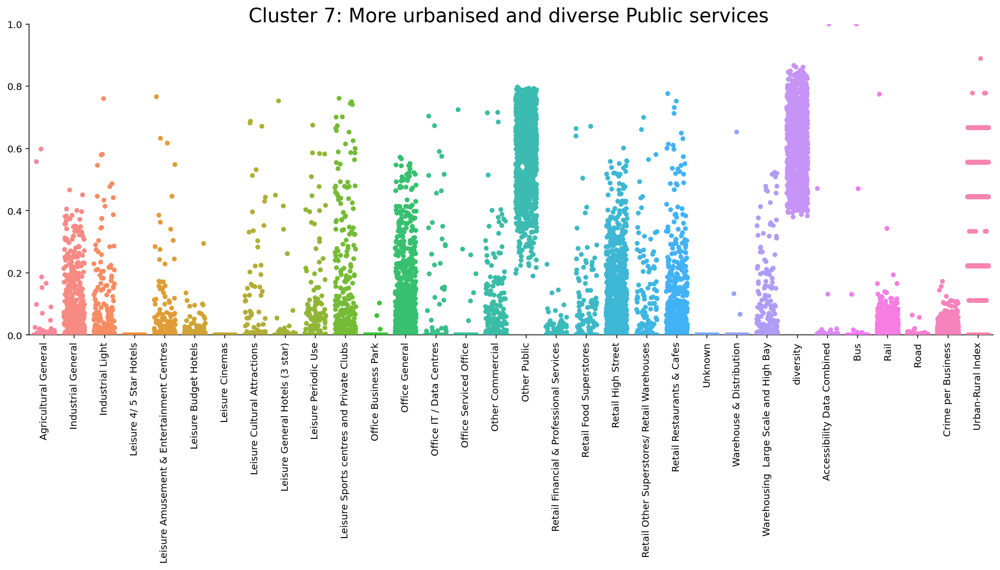

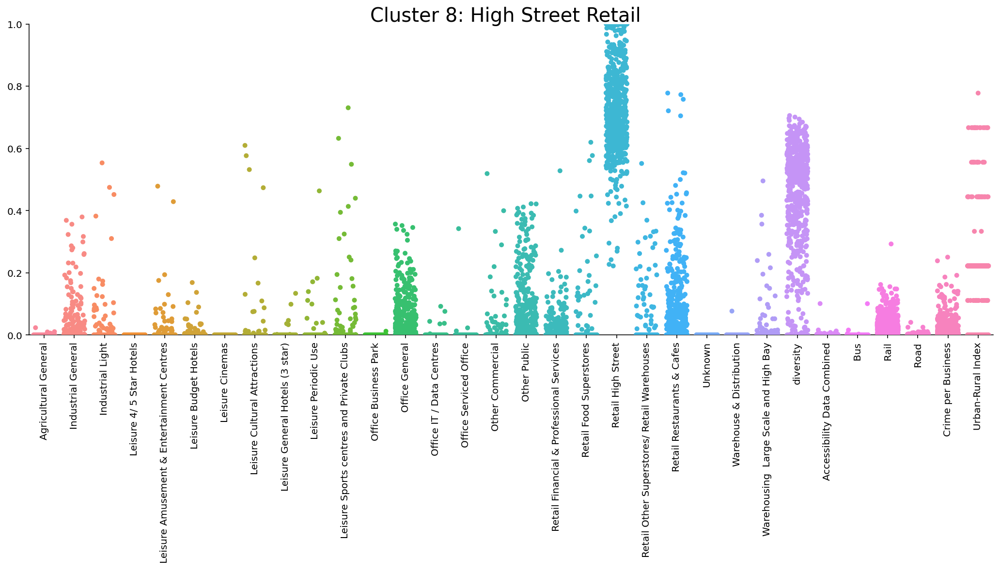

In [40]:
#Visualising compositions of clusters with Catplots

x = sns.catplot(data=sample_cluster0, jitter=0.35, aspect=3)
x.set_xticklabels(rotation=90)
x.fig.suptitle('Cluster 0: Mixed', fontsize=20, y=1.02)
plt.ylim(0, 1)

x = sns.catplot(data=sample_cluster1, jitter=0.35, aspect=3)
x.set_xticklabels(rotation=90)
x.fig.suptitle('Cluster 1: Urban mixed commercial land use (Retail focused)', fontsize=20, y=1.02)
plt.ylim(0, 1)

x = sns.catplot(data=sample_cluster2, jitter=0.35, aspect=3)
x.set_xticklabels(rotation=90)
x.fig.suptitle('Cluster 2: Public services', fontsize=20, y=1.02)
plt.ylim(0, 1)

x = sns.catplot(data=sample_cluster3, jitter=0.35, aspect=3)
x.set_xticklabels(rotation=90)
x.fig.suptitle('Cluster 3: Diverse Industrial and warehousing areas', fontsize=20, y=1.02)
plt.ylim(0, 1)

x = sns.catplot(data=sample_cluster4, jitter=0.35, aspect=3)
x.set_xticklabels(rotation=90)
x.fig.suptitle('Cluster 4: Urban office spaces', fontsize=20, y=1.02)
plt.ylim(0, 1)

x = sns.catplot(data=sample_cluster5, jitter=0.35, aspect=3)
x.set_xticklabels(rotation=90)
x.fig.suptitle('Cluster 5: Less urbanised mixed commercial land use (warehousing, retail and leisure spaces)', fontsize=20, y=1.02)
plt.ylim(0, 1)

x = sns.catplot(data=sample_cluster6, jitter=0.35, aspect=3)
x.set_xticklabels(rotation=90)
x.fig.suptitle('Cluster 6: Low diversity Industrial areas', fontsize=20, y=1.02)
plt.ylim(0, 1)

x = sns.catplot(data=sample_cluster7, jitter=0.35, aspect=3)
x.set_xticklabels(rotation=90)
x.fig.suptitle('Cluster 7: More urbanised and diverse Public services', fontsize=20, y=1.02)
plt.ylim(0, 1)

x = sns.catplot(data=sample_cluster8, jitter=0.35, aspect=3)
x.set_xticklabels(rotation=90)
x.fig.suptitle('Cluster 8: High Street Retail ', fontsize=20, y=1.02)
plt.ylim(0, 1)

In [68]:
#create dataframe for each cluster for correlation matrices

cluster0 = clustertable[clustertable['Clusters'] ==0] 
cluster1 = clustertable[clustertable['Clusters'] ==1] 
cluster2 = clustertable[clustertable['Clusters'] ==2] 
cluster3 = clustertable[clustertable['Clusters'] ==3]
cluster4 = clustertable[clustertable['Clusters'] ==4]
cluster5 = clustertable[clustertable['Clusters'] ==5] 
cluster6 = clustertable[clustertable['Clusters'] ==6] 
cluster7 = clustertable[clustertable['Clusters'] ==7] 
cluster8 = clustertable[clustertable['Clusters'] ==8]

In [69]:
#delete cluster column
del cluster0['Clusters']
del cluster1['Clusters']
del cluster2['Clusters']
del cluster3['Clusters']
del cluster4['Clusters']
del cluster5['Clusters']
del cluster6['Clusters']
del cluster7['Clusters']
del cluster8['Clusters']

Text(0.5, 1.0, 'Cluster 8')

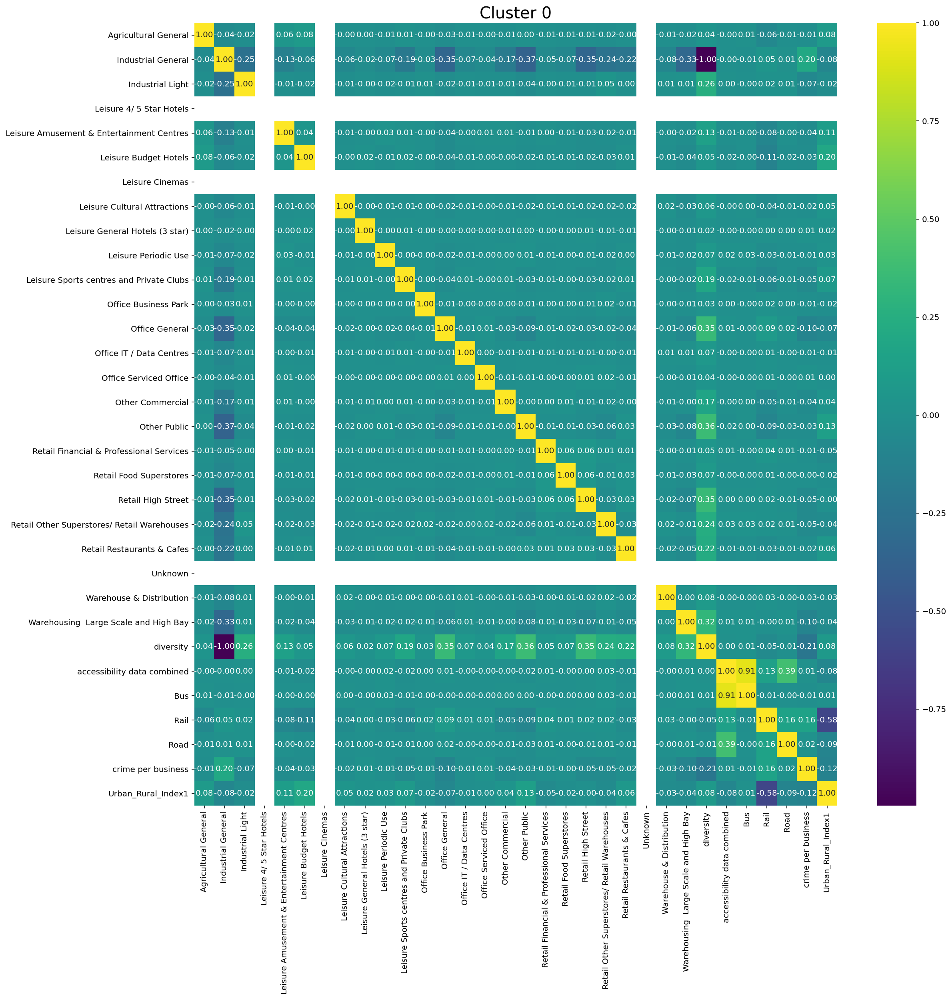

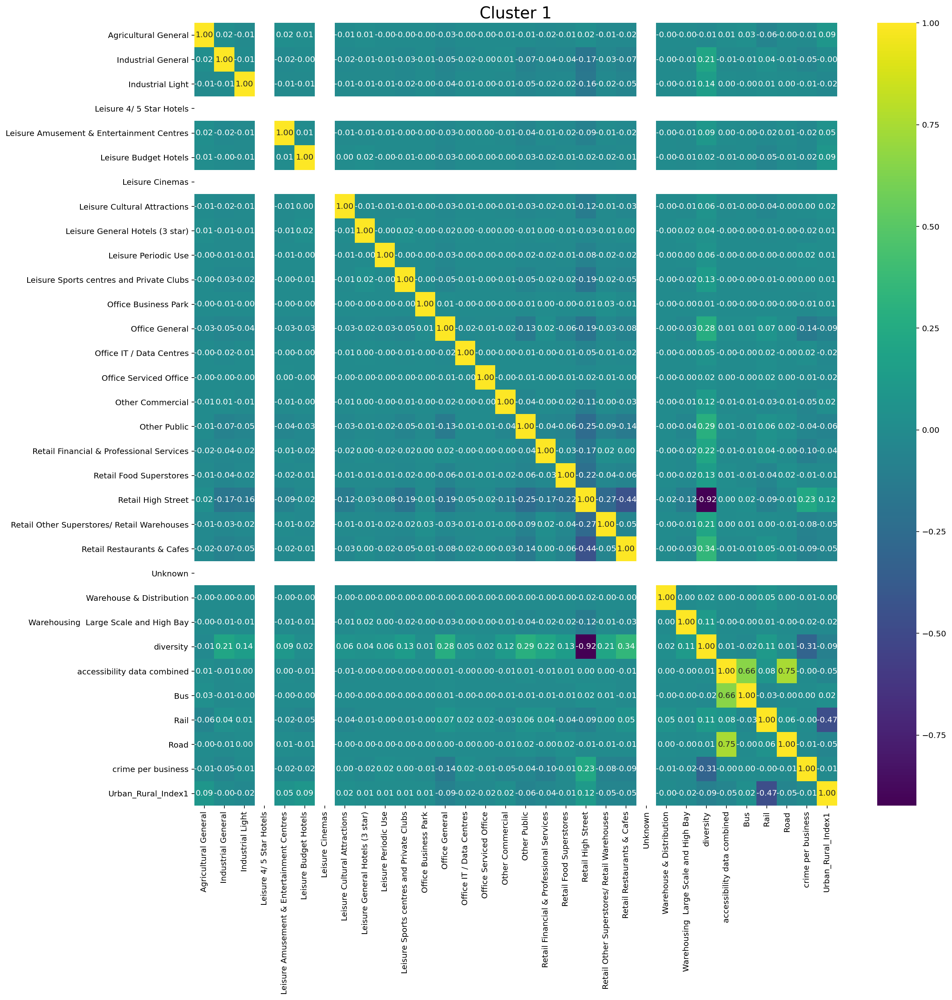

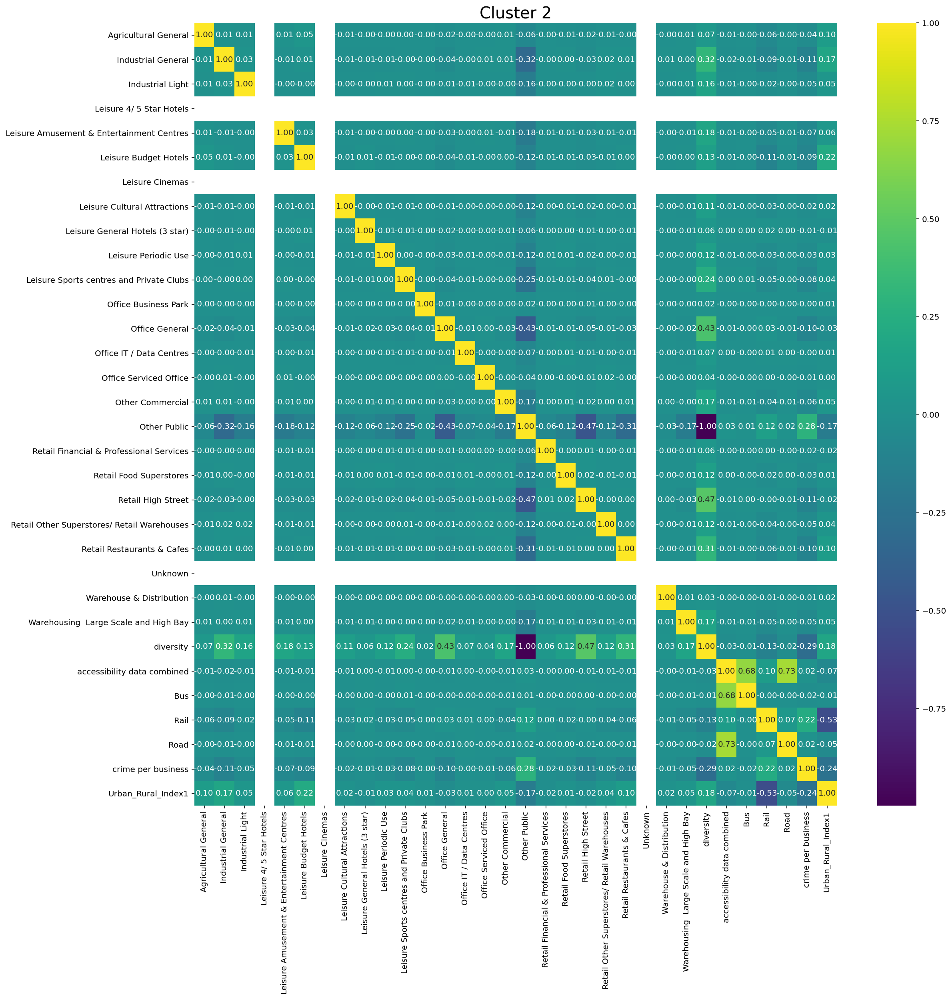

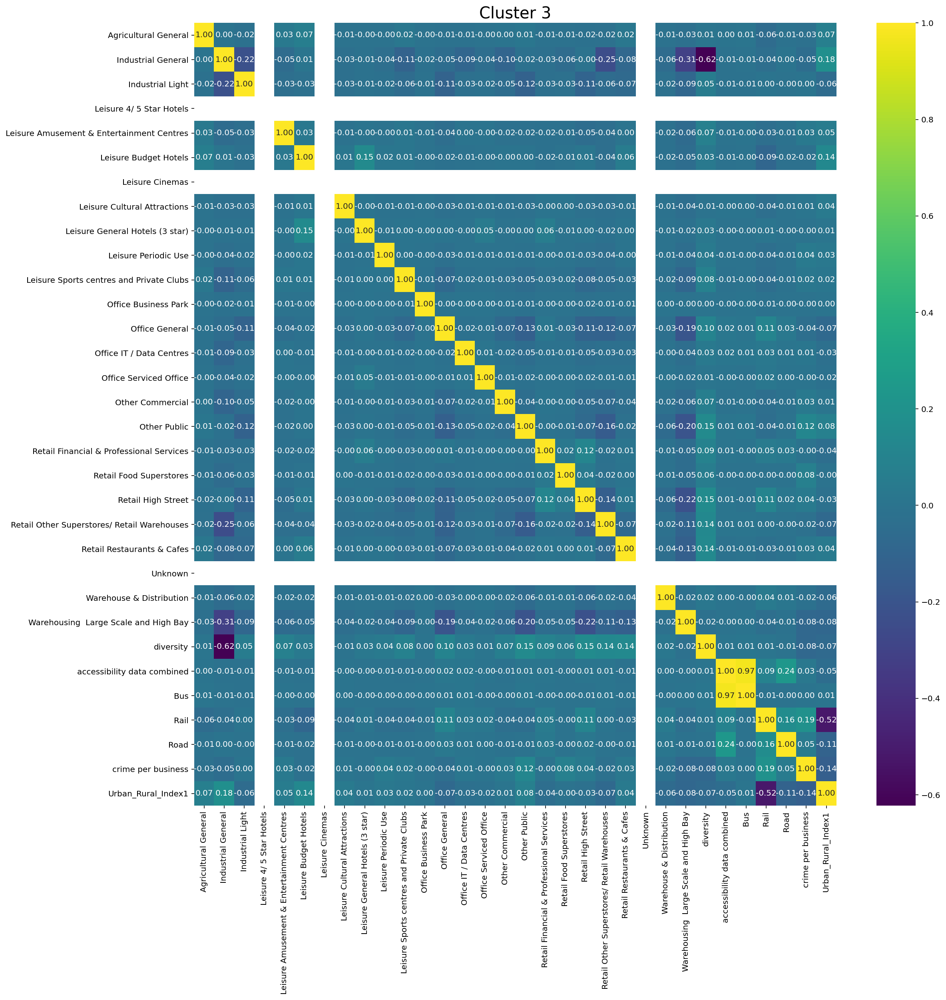

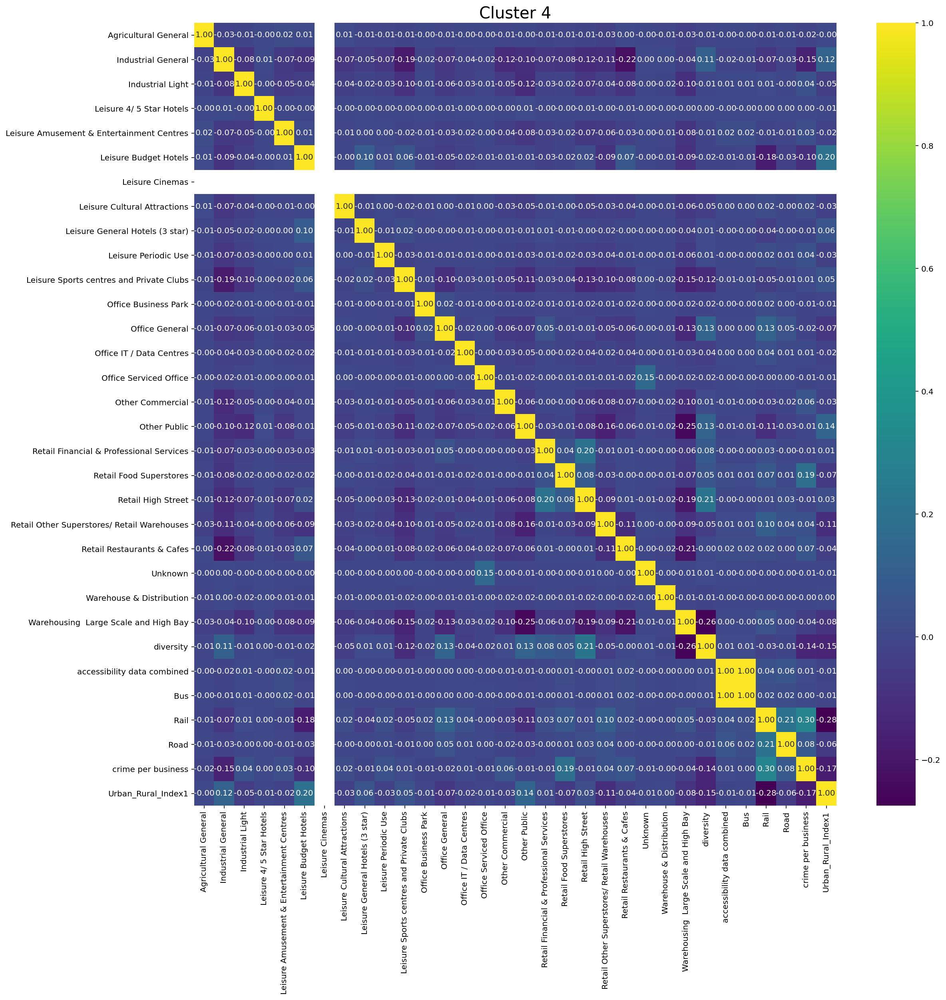

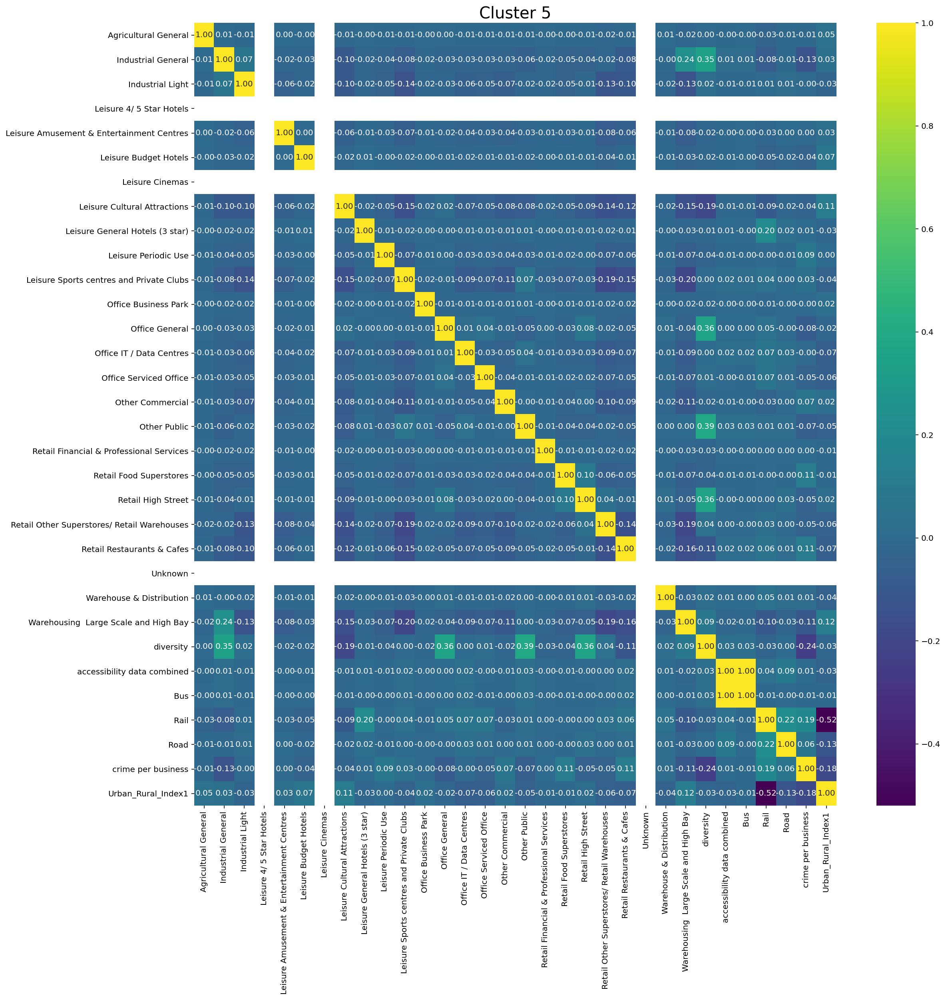

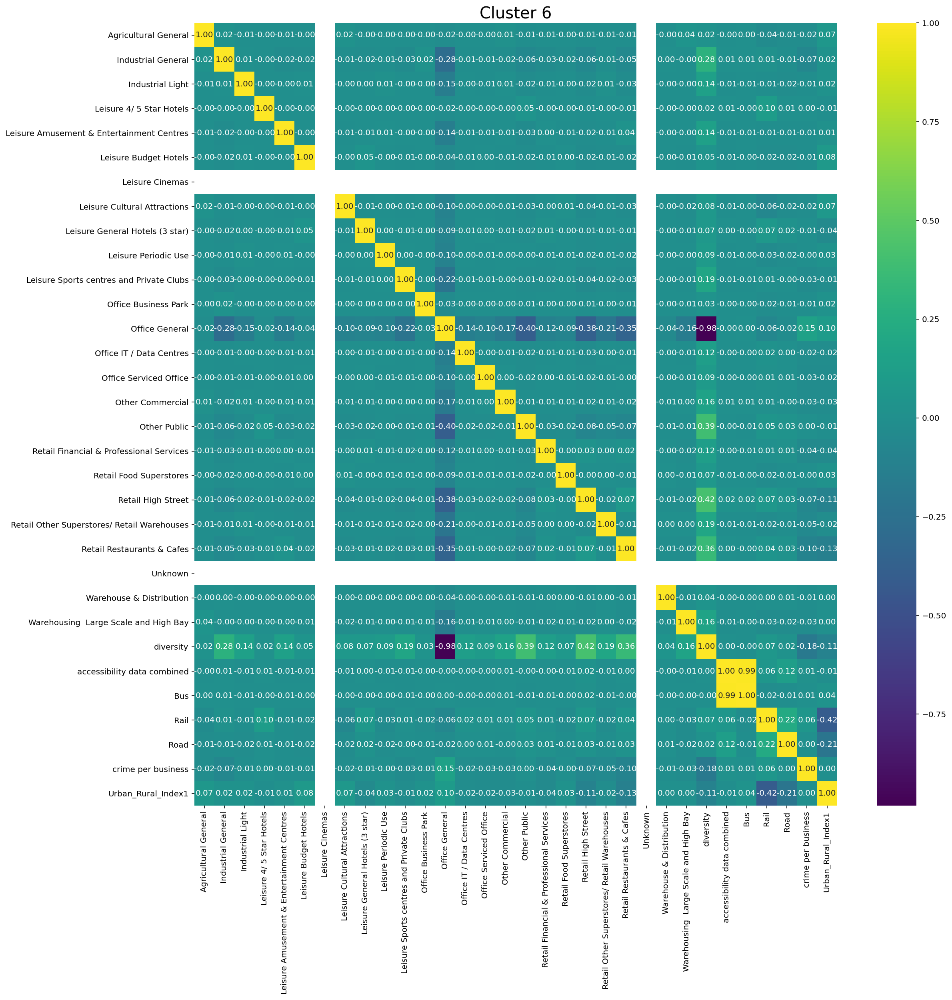

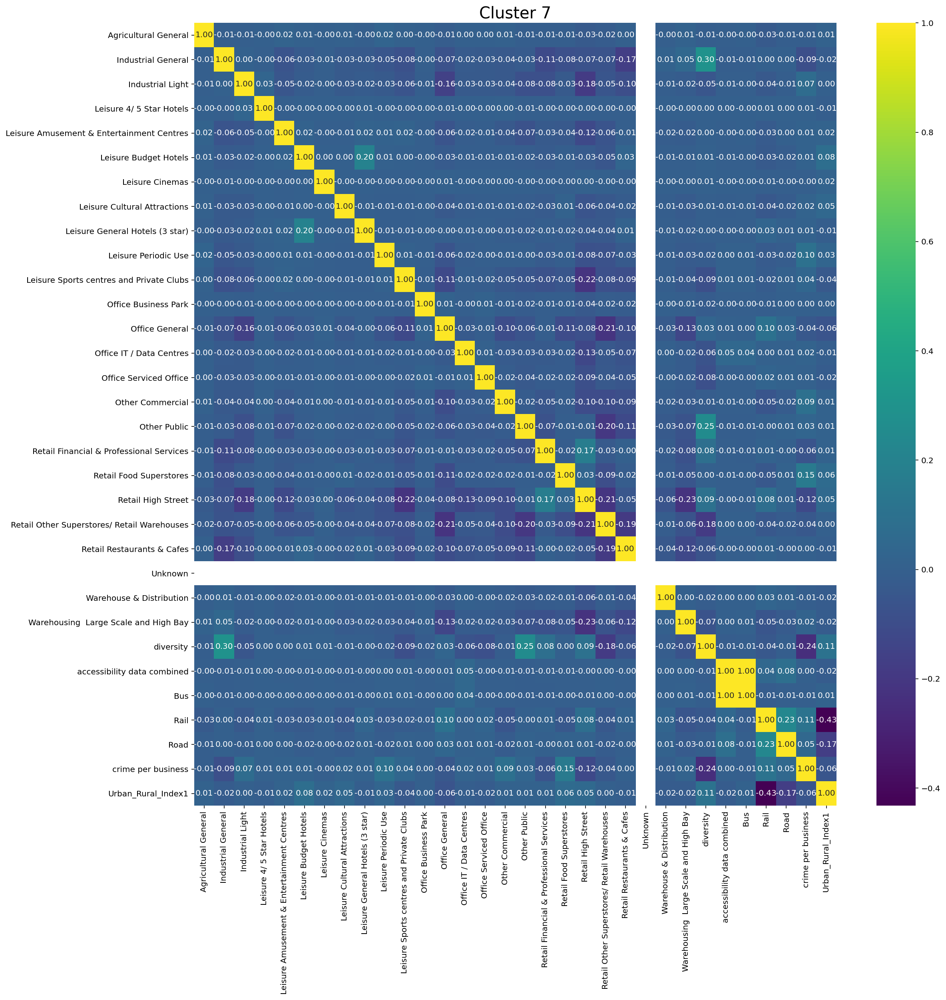

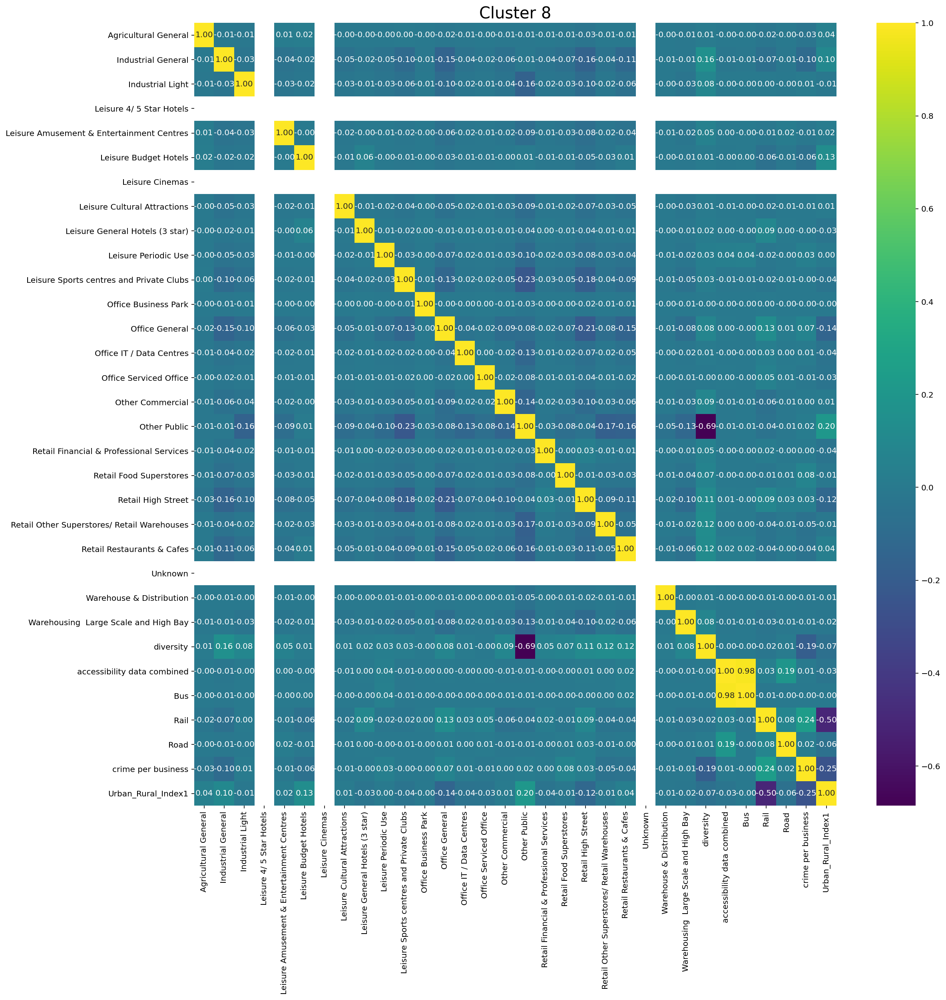

In [70]:
#correlation heatmaps for clusters

# set figure size
plt.figure(figsize=(18,18))
# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
sns.heatmap(cluster0.corr(), annot=True, cmap='viridis', fmt=".2f");
plt.title('Cluster 0', fontsize=20)

# set figure size
plt.figure(figsize=(18,18))
# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
sns.heatmap(cluster1.corr(), annot=True, cmap='viridis', fmt=".2f");
plt.title('Cluster 1', fontsize=20)

# set figure size
plt.figure(figsize=(18,18))
# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
sns.heatmap(cluster2.corr(), annot=True, cmap='viridis', fmt=".2f");
plt.title('Cluster 2', fontsize=20)

# set figure size
plt.figure(figsize=(18,18))
# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
sns.heatmap(cluster3.corr(), annot=True, cmap='viridis', fmt=".2f");
plt.title('Cluster 3', fontsize=20)

# set figure size
plt.figure(figsize=(18,18))
# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
sns.heatmap(cluster4.corr(), annot=True, cmap='viridis', fmt=".2f");
plt.title('Cluster 4', fontsize=20)

# set figure size
plt.figure(figsize=(18,18))
# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
sns.heatmap(cluster5.corr(), annot=True, cmap='viridis', fmt=".2f");
plt.title('Cluster 5', fontsize=20)

# set figure size
plt.figure(figsize=(18,18))
# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
sns.heatmap(cluster6.corr(), annot=True, cmap='viridis', fmt=".2f");
plt.title('Cluster 6', fontsize=20)

# set figure size
plt.figure(figsize=(18,18))
# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
sns.heatmap(cluster7.corr(), annot=True, cmap='viridis', fmt=".2f");
plt.title('Cluster 7', fontsize=20)

# set figure size
plt.figure(figsize=(18,18))
# plot a heatmap of the correlation table created above, annot= True annotates the cells with the correlation value
sns.heatmap(cluster8.corr(), annot=True, cmap='viridis', fmt=".2f");
plt.title('Cluster 8', fontsize=20)



# Distripution of the degree of urbanisation amongst the clusters

### This anaylsis was done for degree of urbanisation in particular due to this variable being ordinal data, thus it is slightly harder to dicern the distribution from the catplots displayed above

In [71]:
#redownloading the dataframe for cluster type and addtional variables
clustertable2 =pd.read_csv('C:/Users/medshesa/Documents/Whytehawk Project/Whytehawk Data/table with clusters2.csv')

In [72]:
clustertable2

,Unnamed: 0,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),...,Warehouse & Distribution,Warehousing Large Scale and High Bay,diversity,accessibility data combined,Bus,Rail,Road,crime per business,Urban_Rural_Index1,Clusters
0,AL1 1B,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.6888,0.0008,0.0000,0.0384,0.0007,0.0038,0.2222,1
1,AL1 1D,0.0000,0.0000,0.0000,0.0000,0.0000,0.0107,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0481,0.0006,0.0000,0.0321,0.0007,0.0125,0.2222,2
2,AL1 1E,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.7234,0.0009,0.0000,0.0515,0.0008,0.0003,0.2222,1
3,AL1 1H,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0103,...,0.0000,0.0000,0.4735,0.0008,0.0000,0.0409,0.0008,0.0032,0.2222,4
4,AL1 1J,0.0000,0.3926,0.0000,0.0000,0.1878,0.0000,0.0000,0.0429,0.0000,...,0.0000,0.0000,0.8473,0.0007,0.0000,0.0330,0.0007,0.0019,0.2222,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87238,YO8 9P,0.0000,0.3704,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.6049,0.5617,0.0001,0.0000,0.0070,0.0001,0.0097,0.6667,5
87239,YO8 9R,0.0000,0.0000,0.0000,0.0000,0.0000,0.0147,0.0000,0.0000,0.0000,...,0.0000,0.0000,0.0329,0.0002,0.0000,0.0077,0.0002,0.0195,0.4444,2
87240,YO8 9S,0.0000,0.7005,0.0000,0.0000,0.0000,0.0000,0.0000,0.2995,0.0000,...,0.0000,0.0000,0.4755,0.0002,0.0000,0.0076,0.0002,0.0088,0.2222,3
87241,YO8 9T,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,...,0.0000,0.0000,0.0000,0.0002,0.0000,0.0076,0.0001,0.0139,0.2222,0


In [73]:
#Converting urban rural numeric values index to text
clustertable2['Cluster'] = clustertable2['Clusters'].map({0: 'As yet untitled', 1: 'Urban mixed commercial land use (Retail focused)', 2: 'Public services', 3: 'Diverse Industrial and warehousing areas', 4: 'Urban office spaces', 5: 'Less urbanised mixed commercial land use (warehousing, retail and leisure spaces)', 6: 'Low diversity Industrial areas', 7: 'More urbanised and diverse Public services', 8: 'High Street Retail'})
#clustertable2['Urban_Rural_Index1'] = clustertable2['Urban_Rural_Index'].replace(['Urban major conurbation', 'Urban city and town', 'Rural hamlets and isolated dwellings','Rural village','Rural town and fringe', 'Rural hamlets and isolated dwellings in a sparse setting', 'Urban city and town in a sparse setting','Rural town and fringe in a sparse setting', 'Rural village in a sparse setting', 'Urban minor conurbation'],['1','3','7','6','5','10','4','8','9','2'])
#clustertable2["Urban_Rural_Index"] = clustertable2['Urban_Rural_Index1'].replace(['0.0','0.2222222222222222','0.6666666666666665','0.5555555555555556','0.4444444444444445','1.0','0.3333333333333333','0.7777777777777777', '0.8888888888888888', '0.1111111111111111'], ['Urban major conurbation', 'Urban city and town', 'Rural hamlets and isolated dwellings','Rural village','Rural town and fringe', 'Rural hamlets and isolated dwellings in a sparse setting', 'Urban city and town in a sparse setting','Rural town and fringe in a sparse setting', 'Rural village in a sparse setting', 'Urban minor conurbation'])


In [74]:
#Display unique values in Urban-Rual index
clustertable2['Urban_Rural_Index1'].unique()

array([0.22222222, 0.55555556, 0.66666667, 0.        , 0.44444444,
       1.        , 0.77777778, 0.88888889, 0.33333333, 0.11111111])

In [75]:
#Datatypes
clustertable2.dtypes

Unnamed: 0                                      object
Agricultural General                           float64
Industrial General                             float64
Industrial Light                               float64
Leisure 4/ 5 Star Hotels                       float64
Leisure Amusement & Entertainment Centres      float64
Leisure Budget Hotels                          float64
Leisure Cinemas                                float64
Leisure Cultural Attractions                   float64
Leisure General Hotels (3 star)                float64
Leisure Periodic Use                           float64
Leisure Sports centres and Private Clubs       float64
Office Business Park                           float64
Office General                                 float64
Office IT / Data Centres                       float64
Office Serviced Office                         float64
Other Commercial                               float64
Other Public                                   float64
Retail Fin

In [76]:
#convert 'Urban_Rural_Index1' to string
clustertable2['Urban_Rural_Index1']= clustertable2['Urban_Rural_Index1'].astype(str)

In [77]:
clustertable2

,Unnamed: 0,Agricultural General,Industrial General,Industrial Light,Leisure 4/ 5 Star Hotels,Leisure Amusement & Entertainment Centres,Leisure Budget Hotels,Leisure Cinemas,Leisure Cultural Attractions,Leisure General Hotels (3 star),...,Warehousing Large Scale and High Bay,diversity,accessibility data combined,Bus,Rail,Road,crime per business,Urban_Rural_Index1,Clusters,Cluster
0,AL1 1B,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.6888,0.0008,0.0000,0.0384,0.0007,0.0038,0.2222222222222222,1,Urban mixed commercial land use (Retail focused)
1,AL1 1D,0.0000,0.0000,0.0000,0.0000,0.0000,0.0107,0.0000,0.0000,0.0000,...,0.0000,0.0481,0.0006,0.0000,0.0321,0.0007,0.0125,0.2222222222222222,2,Public services
2,AL1 1E,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.0000,0.7234,0.0009,0.0000,0.0515,0.0008,0.0003,0.2222222222222222,1,Urban mixed commercial land use (Retail focused)
3,AL1 1H,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0103,...,0.0000,0.4735,0.0008,0.0000,0.0409,0.0008,0.0032,0.2222222222222222,4,Urban office spaces
4,AL1 1J,0.0000,0.3926,0.0000,0.0000,0.1878,0.0000,0.0000,0.0429,0.0000,...,0.0000,0.8473,0.0007,0.0000,0.0330,0.0007,0.0019,0.2222222222222222,3,Diverse Industrial and warehousing areas
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
87238,YO8 9P,0.0000,0.3704,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,...,0.6049,0.5617,0.0001,0.0000,0.0070,0.0001,0.0097,0.6666666666666665,5,Less urbanised mixed commercial land use (ware...
87239,YO8 9R,0.0000,0.0000,0.0000,0.0000,0.0000,0.0147,0.0000,0.0000,0.0000,...,0.0000,0.0329,0.0002,0.0000,0.0077,0.0002,0.0195,0.4444444444444445,2,Public services
87240,YO8 9S,0.0000,0.7005,0.0000,0.0000,0.0000,0.0000,0.0000,0.2995,0.0000,...,0.0000,0.4755,0.0002,0.0000,0.0076,0.0002,0.0088,0.2222222222222222,3,Diverse Industrial and warehousing areas
87241,YO8 9T,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,0.0000,1.0000,0.0000,...,0.0000,0.0000,0.0002,0.0000,0.0076,0.0001,0.0139,0.2222222222222222,0,As yet untitled


In [82]:
#create a new dataframe with count of each cluster per urban-rural 
bar = pd.DataFrame(clustertable2.groupby(['Urban_Rural_Index1', 'Clusters']).size())
#reset index
bar = bar.reset_index()

In [83]:
bar

,Urban_Rural_Index1,Clusters,0
0,0.0,0,1753
1,0.0,1,7883
2,0.0,2,2491
3,0.0,3,3184
4,0.0,4,3273
...,...,...,...
75,1.0,2,96
76,1.0,4,10
77,1.0,5,1014
78,1.0,6,99


In [84]:
bar.dtypes

Urban_Rural_Index1    object
Clusters               int64
0                      int64
dtype: object

In [86]:
#replace cluster type with total postzone count so that percentages can be calculated
bar['column name'] = bar['Clusters'].replace([0,1,2,3,4,5,6,7,8],[7081,19635,8678,10945,6318,11230,7493,10278,5585])

In [88]:
#Rename columns
bar = bar.rename(columns={0: 'count', 'column name':'total count'})

In [89]:
bar

,Urban_Rural_Index1,Clusters,count,total count
0,0.0,0,1753,7081
1,0.0,1,7883,19635
2,0.0,2,2491,8678
3,0.0,3,3184,10945
4,0.0,4,3273,6318
...,...,...,...,...
75,1.0,2,96,8678
76,1.0,4,10,6318
77,1.0,5,1014,11230
78,1.0,6,99,7493


In [43]:
#Calculate the percentages within each catagory
bar['percentage'] = (bar['count']/bar['total count'])*100 

In [44]:
bar

,Urban_Rural_Index,Clusters,count,total count,percentage
0,Rural hamlets and isolated dwellings,0,565,7081,7.9791
1,Rural hamlets and isolated dwellings,2,635,8678,7.3174
2,Rural hamlets and isolated dwellings,3,537,10945,4.9063
3,Rural hamlets and isolated dwellings,4,158,6318,2.5008
4,Rural hamlets and isolated dwellings,5,4279,11230,38.1033
...,...,...,...,...,...
75,Urban minor conurbation,3,374,10945,3.4171
76,Urban minor conurbation,4,133,6318,2.1051
77,Urban minor conurbation,6,207,7493,2.7626
78,Urban minor conurbation,7,301,10278,2.9286


In [59]:
#Labelling cluster and urban-rural index
bar['Cluster'] = bar['Clusters'].map({0: '0: As yet untitled', 1: '1: Urban mixed commercial land use (Retail focused)', 2: '2: Public services', 3: '3: Diverse Industrial and warehousing areas', 4: '4: Urban office spaces', 5: '5: Less urbanised mixed commercial land use (warehousing, retail and leisure spaces)', 6: '6: Low diversity Industrial areas', 7: '7: More urbanised and diverse Public services', 8: '8: High Street Retail'})

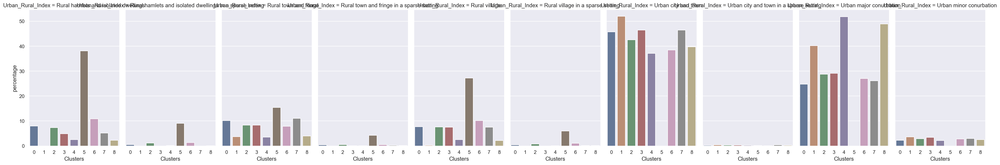

In [28]:
#First plot
g = sns.catplot(x="Clusters", y="percentage", col="Urban_Rural_Index",
                data=bar, saturation=.5,
                kind="bar", ci=None, aspect=.6)

C:\ProgramData\Anaconda3\envs\geo_env\lib\site-packages\seaborn\categorical.py:3762: UserWarning: catplot is a figure-level function and does not accept target axes. You may wish to try barplot
  warnings.warn(msg, UserWarning)


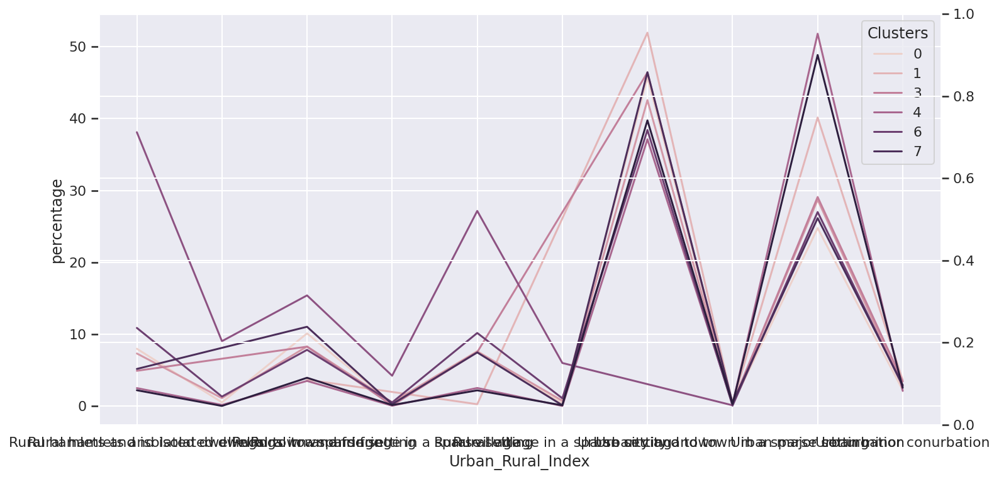

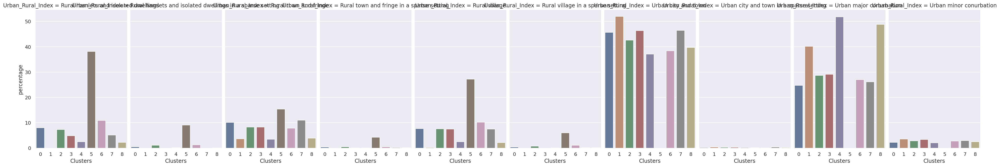

In [104]:
#Line plot
ax1 = sns.set_style(style=None, rc=None )

fig, ax1 = plt.subplots(figsize=(12,6))

sns.lineplot(data=bar, x="Urban_Rural_Index", y="percentage", hue="Clusters", ax=ax1)
ax2 = ax1.twinx()

sns.catplot(x="Clusters", y="percentage", col="Urban_Rural_Index",
                data=bar, saturation=.5,
                kind="bar", ci=None, aspect=.6, ax=ax2)

findfont: Font family ['Helvetica'] not found. Falling back to DejaVu Sans.


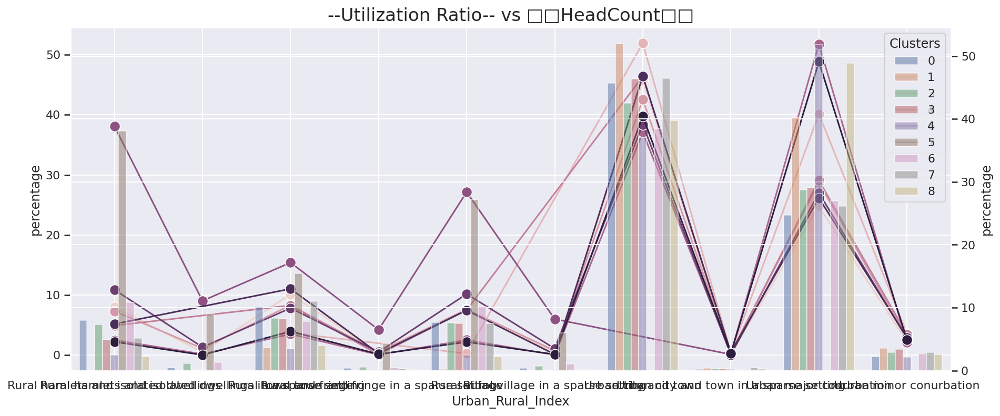

In [105]:
#Line and bar plot overlaid

fig, ax = plt.subplots(figsize=(15,6))
g = sns.lineplot(x='Urban_Rural_Index',  y='percentage', data=bar, ax=ax, hue = 'Clusters',
             marker='o', markersize=10)
ax2 = ax.twinx()
g = sns.barplot(x='Urban_Rural_Index',  y='percentage', data=bar, ax=ax2, hue='Clusters',alpha=.5)
ax.set_title('--Utilization Ratio-- vs □□HeadCount□□', fontsize = 17)
plt.show()

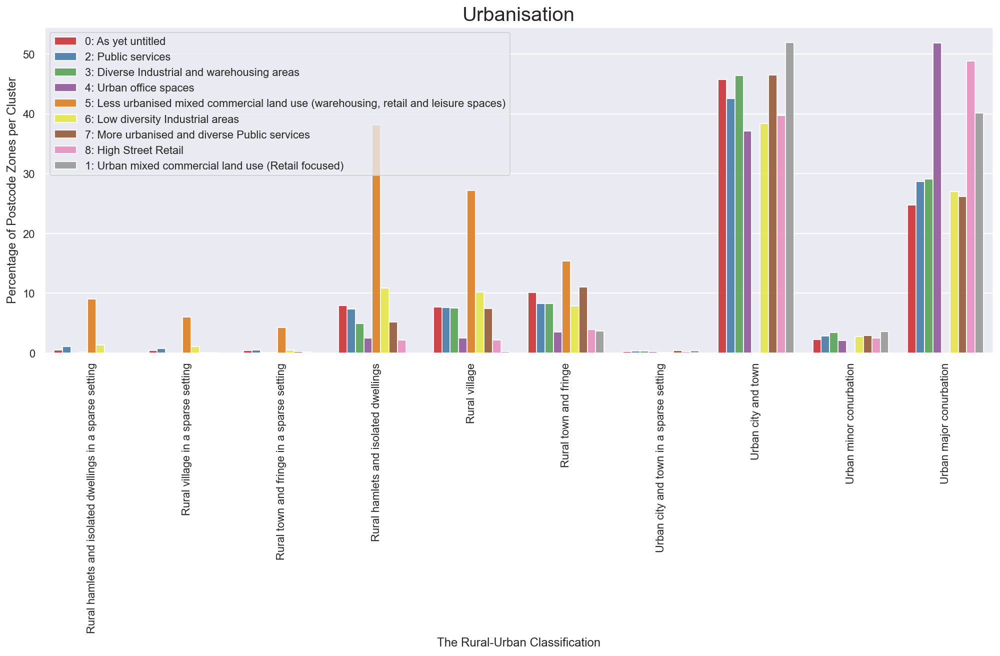

In [60]:
#Final bar plot (this one is to be used)
fig, ax = plt.subplots(figsize=(17,6))
sns.barplot(x='Urban_Rural_Index',  y='percentage', palette="Set1", data=bar, hue='Cluster',alpha=.9, order=["Rural hamlets and isolated dwellings in a sparse setting", "Rural village in a sparse setting", "Rural town and fringe in a sparse setting", "Rural hamlets and isolated dwellings", "Rural village", "Rural town and fringe","Urban city and town in a sparse setting", "Urban city and town", "Urban minor conurbation", "Urban major conurbation"])
plt.xticks(rotation=90)
plt.title('Urbanisation', fontsize=20)
ax.set(xlabel="The Rural-Urban Classification", ylabel = "Percentage of Postcode Zones per Cluster")
plt.legend(loc='upper left')



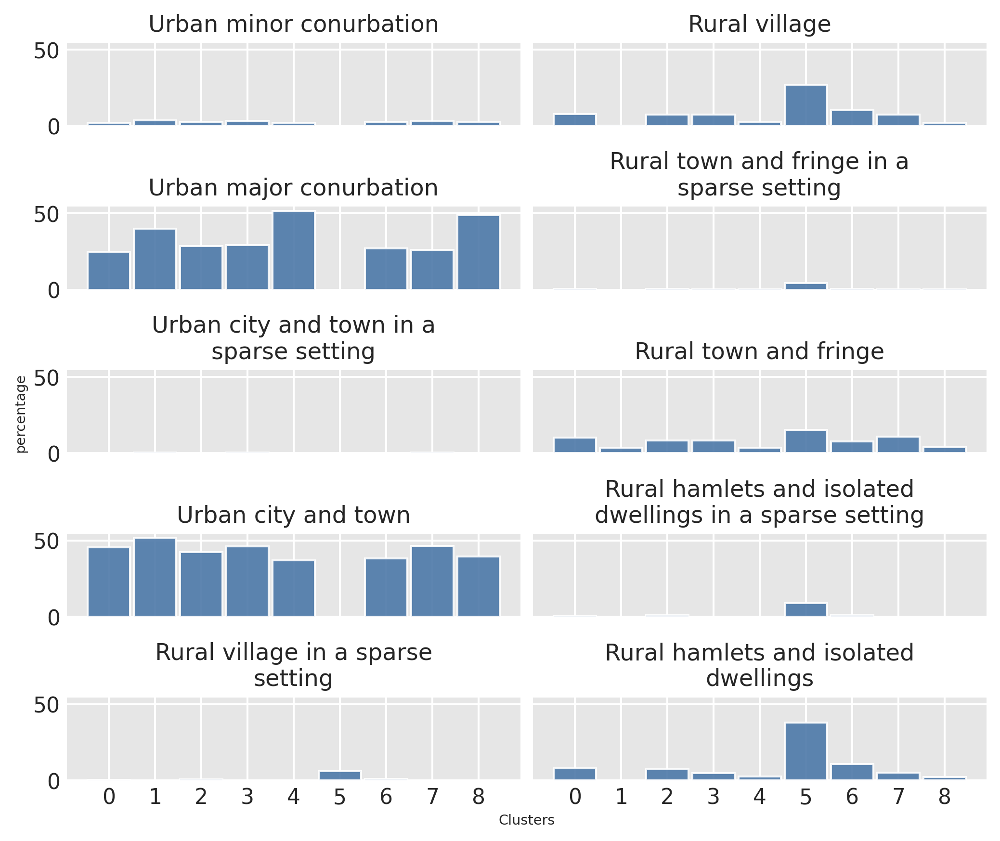

In [98]:
#split into seperate plots
split the bar into distinct graphs
import dexplot as dxp
dxp.bar(x='Clusters', y='percentage', data=bar, aggfunc='median', col='Urban_Rural_Index', wrap=2, col_order='desc')